# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

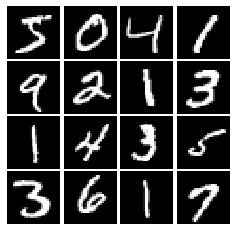

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha * x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size, dim], -1, 1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(units=256, input_shape=(784,), activation=leaky_relu),
        tf.keras.layers.Dense(units=256, activation=leaky_relu),
        tf.keras.layers.Dense(units=1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with input size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(units=1024, input_shape=(noise_dim,), activation=tf.nn.relu),
        tf.keras.layers.Dense(units=1024, activation=tf.nn.relu),
        tf.keras.layers.Dense(units=784, activation=tf.nn.tanh)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    cross_entropy_real = tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.ones_like(logits_real), logits=logits_real)
    cross_entropy_non_fake = tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.zeros_like(logits_fake), logits=logits_fake)
    loss = tf.reduce_mean(cross_entropy_real) + tf.reduce_mean(cross_entropy_non_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    cross_entropy_fake = tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.ones_like(logits_fake), logits=logits_fake)
    loss = tf.reduce_mean(cross_entropy_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 6.02597e-17


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

W0131 10:33:07.925760 140735511257984 deprecation.py:323] From <ipython-input-16-ed1561b7e235>:44: _EagerTensorBase.cpu (from tensorflow.python.framework.ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.identity instead.


Epoch: 0, Iter: 0, D: 0.8797, G:0.7593


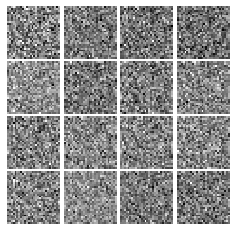

Epoch: 0, Iter: 20, D: 0.5675, G:0.9823


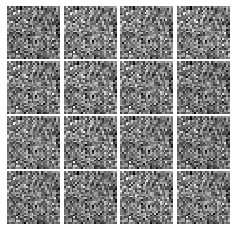

Epoch: 0, Iter: 40, D: 0.3497, G:1.348


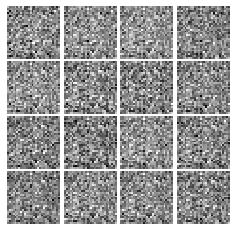

Epoch: 0, Iter: 60, D: 0.1112, G:2.963


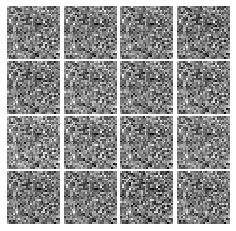

Epoch: 0, Iter: 80, D: 4.123, G:1.49


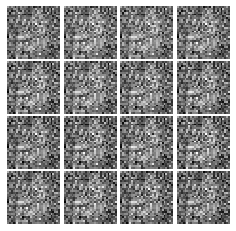

Epoch: 0, Iter: 100, D: 1.129, G:1.05


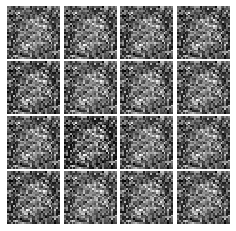

Epoch: 0, Iter: 120, D: 1.3, G:1.349


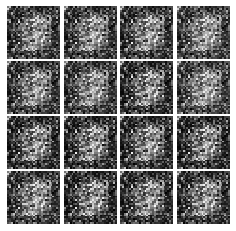

Epoch: 0, Iter: 140, D: 1.547, G:0.8499


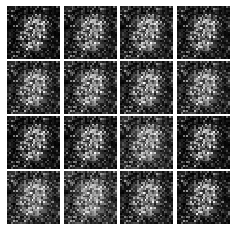

Epoch: 0, Iter: 160, D: 1.811, G:1.026


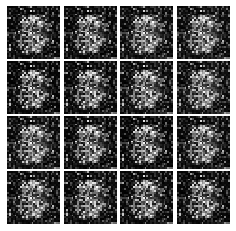

Epoch: 0, Iter: 180, D: 1.928, G:0.7487


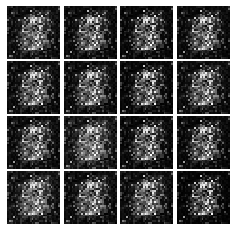

Epoch: 0, Iter: 200, D: 1.102, G:4.005


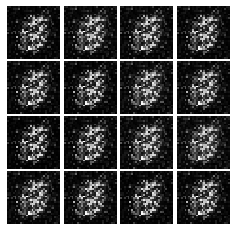

Epoch: 0, Iter: 220, D: 0.6846, G:1.901


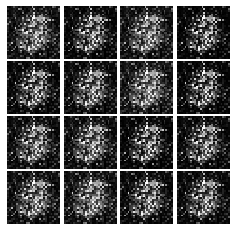

Epoch: 0, Iter: 240, D: 1.59, G:0.8196


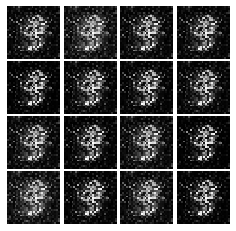

Epoch: 0, Iter: 260, D: 1.699, G:0.9715


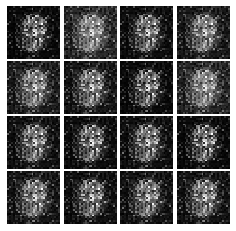

Epoch: 0, Iter: 280, D: 1.363, G:0.7405


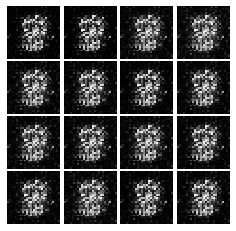

Epoch: 0, Iter: 300, D: 1.39, G:1.141


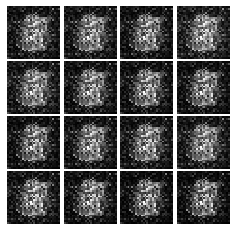

Epoch: 0, Iter: 320, D: 1.575, G:0.8021


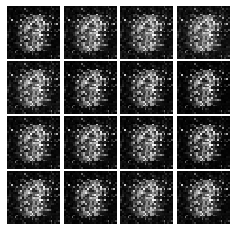

Epoch: 0, Iter: 340, D: 0.7434, G:1.661


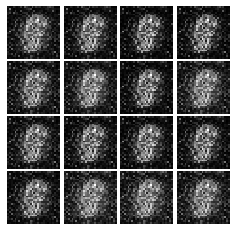

Epoch: 0, Iter: 360, D: 1.031, G:1.379


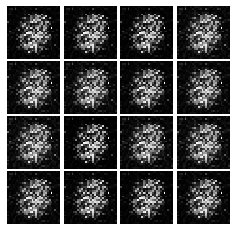

Epoch: 0, Iter: 380, D: 0.7616, G:1.589


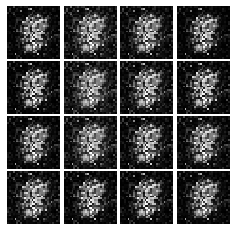

Epoch: 0, Iter: 400, D: 1.934, G:1.035


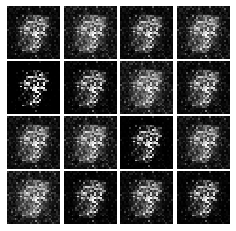

Epoch: 0, Iter: 420, D: 0.9355, G:1.875


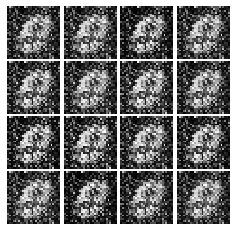

Epoch: 0, Iter: 440, D: 1.819, G:1.064


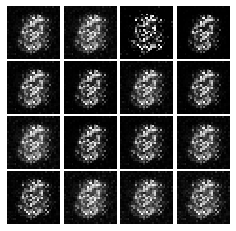

Epoch: 0, Iter: 460, D: 1.497, G:1.175


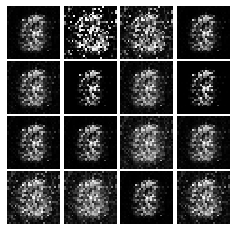

Epoch: 1, Iter: 480, D: 1.299, G:1.231


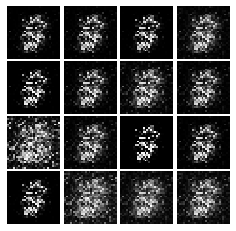

Epoch: 1, Iter: 500, D: 1.365, G:1.349


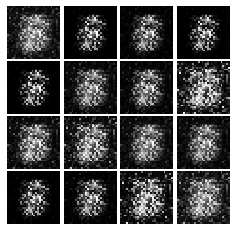

Epoch: 1, Iter: 520, D: 1.177, G:1.202


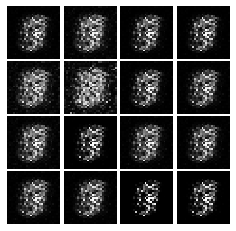

Epoch: 1, Iter: 540, D: 2.599, G:0.2101


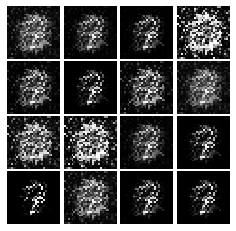

Epoch: 1, Iter: 560, D: 1.302, G:0.8475


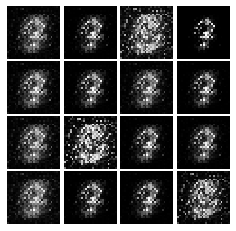

Epoch: 1, Iter: 580, D: 1.272, G:0.9928


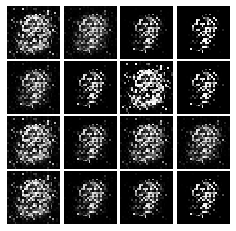

Epoch: 1, Iter: 600, D: 1.064, G:1.173


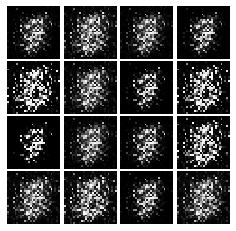

Epoch: 1, Iter: 620, D: 1.639, G:1.432


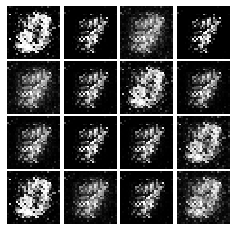

Epoch: 1, Iter: 640, D: 0.9496, G:1.577


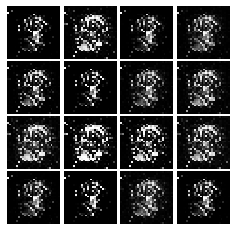

Epoch: 1, Iter: 660, D: 1.424, G:1.551


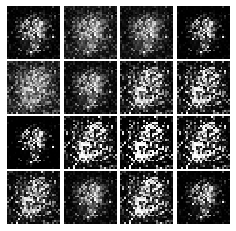

Epoch: 1, Iter: 680, D: 1.079, G:1.387


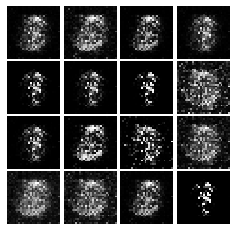

Epoch: 1, Iter: 700, D: 1.311, G:1.149


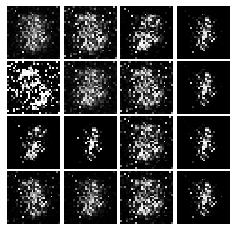

Epoch: 1, Iter: 720, D: 1.008, G:0.7534


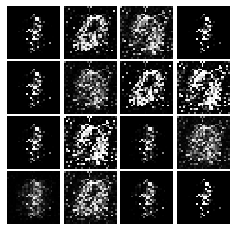

Epoch: 1, Iter: 740, D: 1.211, G:1.187


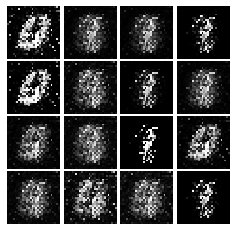

Epoch: 1, Iter: 760, D: 1.02, G:1.72


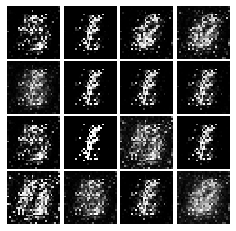

Epoch: 1, Iter: 780, D: 1.086, G:0.6292


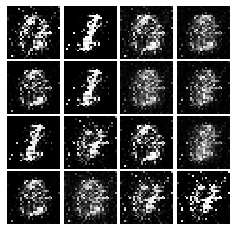

Epoch: 1, Iter: 800, D: 1.816, G:1.221


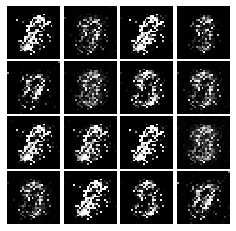

Epoch: 1, Iter: 820, D: 1.125, G:0.8547


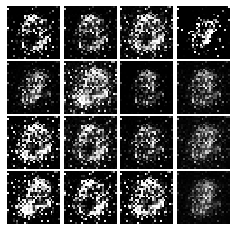

Epoch: 1, Iter: 840, D: 1.426, G:0.9473


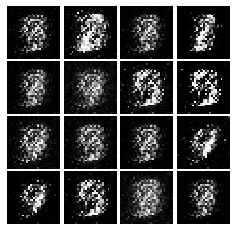

Epoch: 1, Iter: 860, D: 1.202, G:1.036


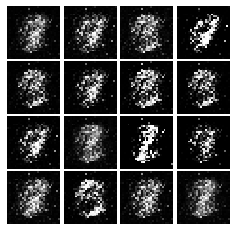

Epoch: 1, Iter: 880, D: 1.11, G:1.252


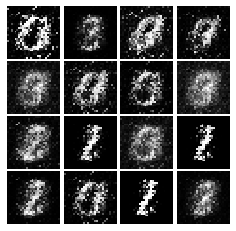

Epoch: 1, Iter: 900, D: 1.653, G:1.025


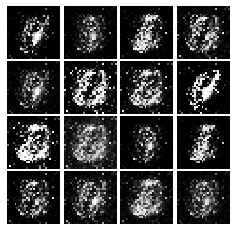

Epoch: 1, Iter: 920, D: 1.622, G:0.8048


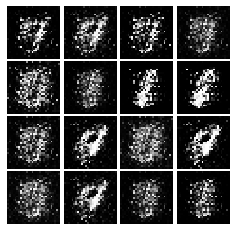

Epoch: 2, Iter: 940, D: 1.158, G:0.9239


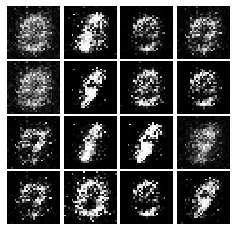

Epoch: 2, Iter: 960, D: 1.249, G:1.097


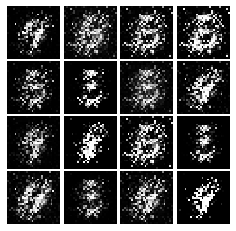

Epoch: 2, Iter: 980, D: 1.14, G:1.042


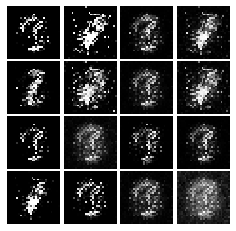

Epoch: 2, Iter: 1000, D: 0.9225, G:1.761


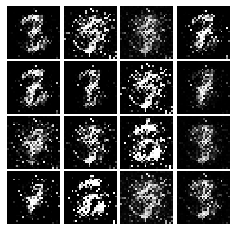

Epoch: 2, Iter: 1020, D: 0.9957, G:0.467


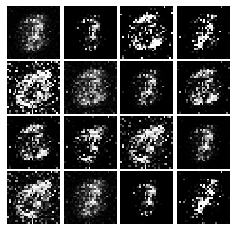

Epoch: 2, Iter: 1040, D: 1.587, G:0.9898


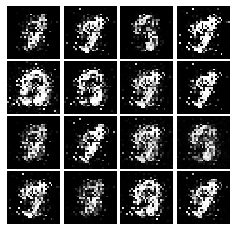

Epoch: 2, Iter: 1060, D: 1.258, G:1.217


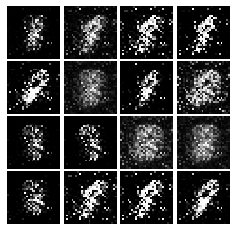

Epoch: 2, Iter: 1080, D: 1.241, G:0.8408


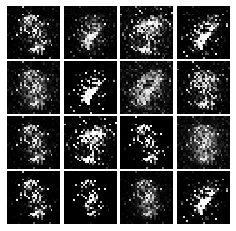

Epoch: 2, Iter: 1100, D: 1.398, G:1.025


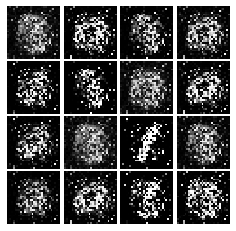

Epoch: 2, Iter: 1120, D: 1.499, G:0.8058


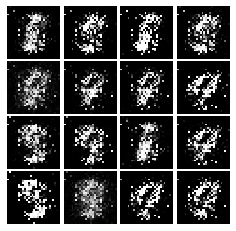

Epoch: 2, Iter: 1140, D: 1.338, G:1.188


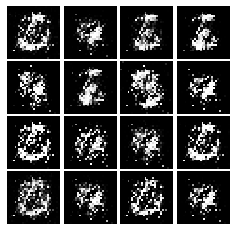

Epoch: 2, Iter: 1160, D: 1.465, G:1.3


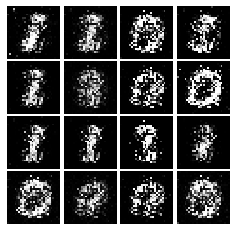

Epoch: 2, Iter: 1180, D: 1.221, G:1.265


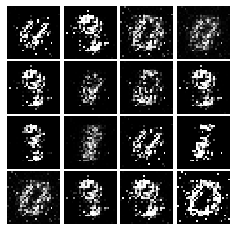

Epoch: 2, Iter: 1200, D: 1.411, G:0.6875


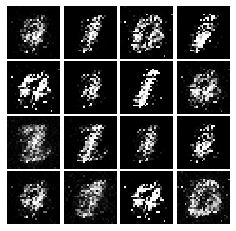

Epoch: 2, Iter: 1220, D: 1.46, G:0.6572


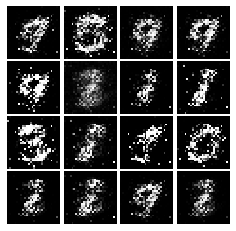

Epoch: 2, Iter: 1240, D: 1.204, G:0.9434


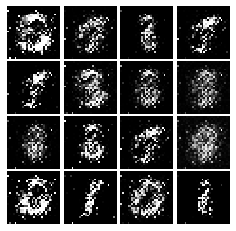

Epoch: 2, Iter: 1260, D: 1.29, G:0.8633


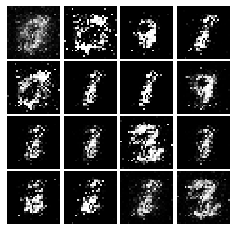

Epoch: 2, Iter: 1280, D: 1.047, G:1.751


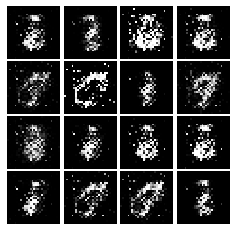

Epoch: 2, Iter: 1300, D: 1.121, G:1.181


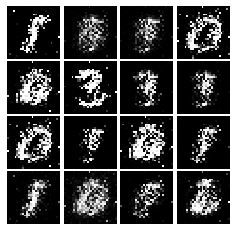

Epoch: 2, Iter: 1320, D: 1.284, G:1.065


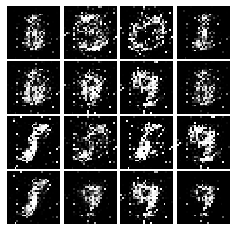

Epoch: 2, Iter: 1340, D: 1.326, G:1.233


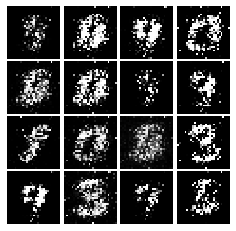

Epoch: 2, Iter: 1360, D: 1.298, G:1.665


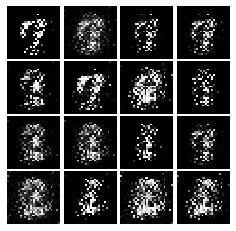

Epoch: 2, Iter: 1380, D: 1.329, G:1.006


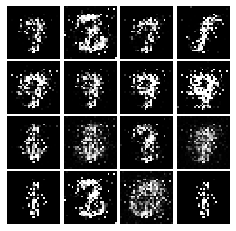

Epoch: 2, Iter: 1400, D: 1.076, G:1.349


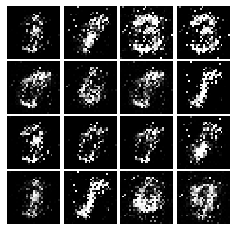

Epoch: 3, Iter: 1420, D: 1.188, G:1.27


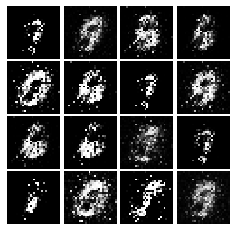

Epoch: 3, Iter: 1440, D: 1.362, G:1.128


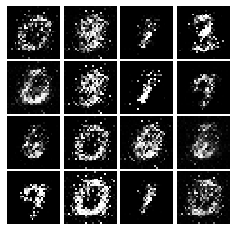

Epoch: 3, Iter: 1460, D: 1.431, G:1.177


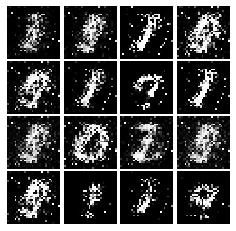

Epoch: 3, Iter: 1480, D: 2.532, G:0.6066


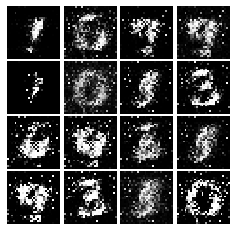

Epoch: 3, Iter: 1500, D: 1.412, G:0.8933


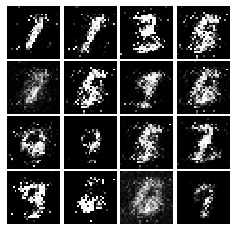

Epoch: 3, Iter: 1520, D: 1.243, G:1.067


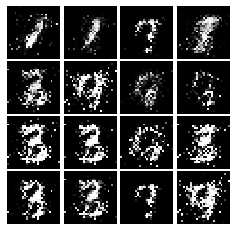

Epoch: 3, Iter: 1540, D: 1.256, G:0.9322


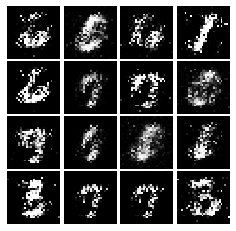

Epoch: 3, Iter: 1560, D: 1.376, G:0.7482


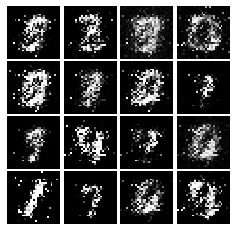

Epoch: 3, Iter: 1580, D: 1.131, G:1.179


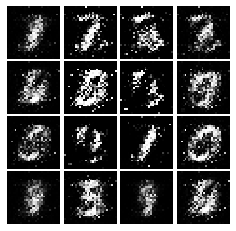

Epoch: 3, Iter: 1600, D: 1.436, G:0.9568


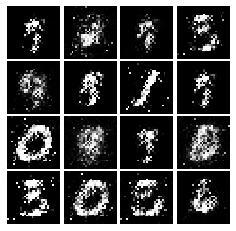

Epoch: 3, Iter: 1620, D: 0.9221, G:1.242


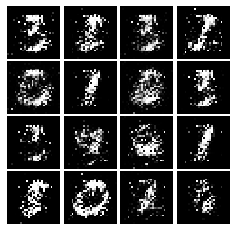

Epoch: 3, Iter: 1640, D: 1.29, G:1.213


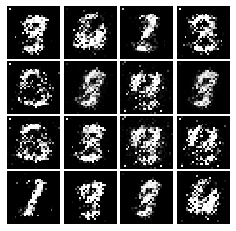

Epoch: 3, Iter: 1660, D: 1.358, G:1.084


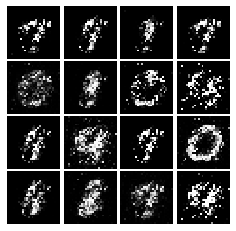

Epoch: 3, Iter: 1680, D: 1.331, G:0.7841


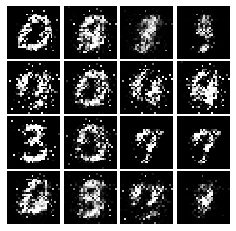

Epoch: 3, Iter: 1700, D: 1.382, G:0.8154


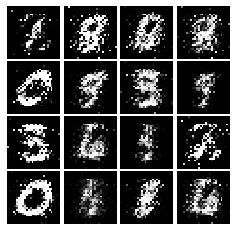

Epoch: 3, Iter: 1720, D: 1.251, G:0.9188


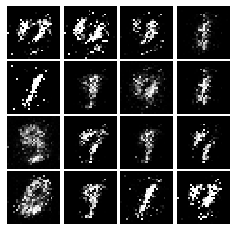

Epoch: 3, Iter: 1740, D: 1.292, G:0.7523


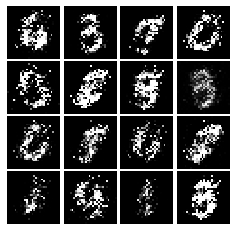

Epoch: 3, Iter: 1760, D: 1.113, G:2.022


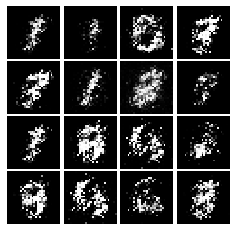

Epoch: 3, Iter: 1780, D: 1.291, G:0.9171


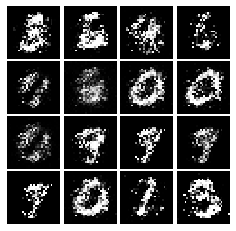

Epoch: 3, Iter: 1800, D: 1.342, G:0.8661


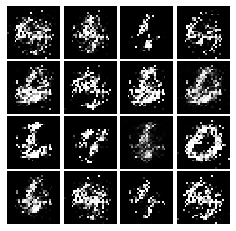

Epoch: 3, Iter: 1820, D: 1.405, G:0.9305


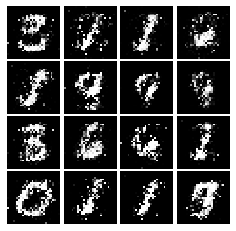

Epoch: 3, Iter: 1840, D: 1.277, G:0.8979


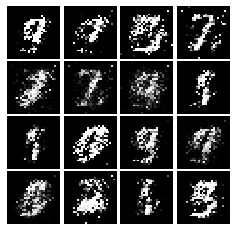

Epoch: 3, Iter: 1860, D: 1.223, G:0.9232


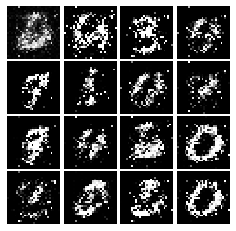

Epoch: 4, Iter: 1880, D: 1.286, G:0.6522


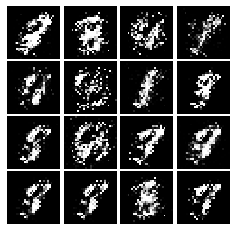

Epoch: 4, Iter: 1900, D: 1.301, G:0.9276


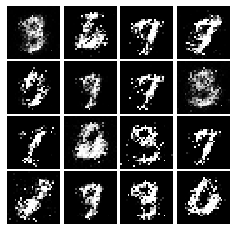

Epoch: 4, Iter: 1920, D: 1.264, G:0.9051


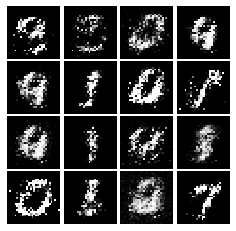

Epoch: 4, Iter: 1940, D: 1.236, G:0.8936


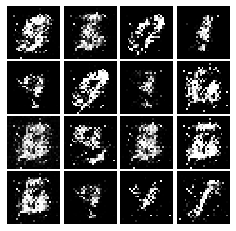

Epoch: 4, Iter: 1960, D: 1.293, G:2.471


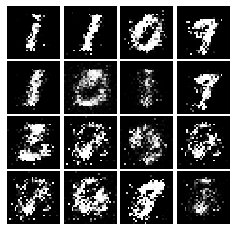

Epoch: 4, Iter: 1980, D: 1.32, G:0.9878


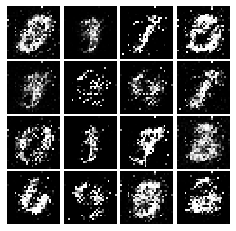

Epoch: 4, Iter: 2000, D: 1.372, G:1.463


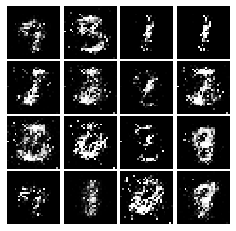

Epoch: 4, Iter: 2020, D: 1.345, G:0.8827


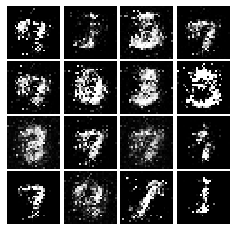

Epoch: 4, Iter: 2040, D: 1.169, G:0.9593


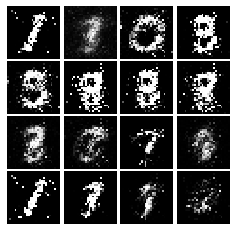

Epoch: 4, Iter: 2060, D: 1.255, G:0.9256


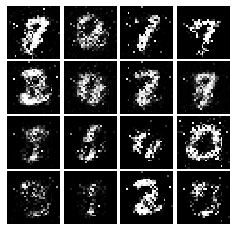

Epoch: 4, Iter: 2080, D: 1.367, G:0.943


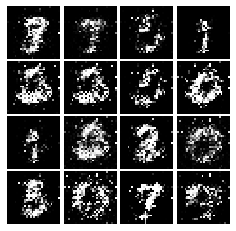

Epoch: 4, Iter: 2100, D: 1.279, G:0.8893


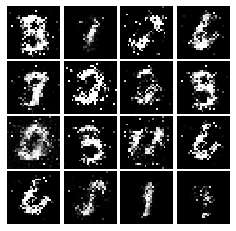

Epoch: 4, Iter: 2120, D: 1.231, G:0.9982


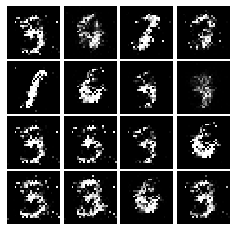

Epoch: 4, Iter: 2140, D: 1.331, G:1.063


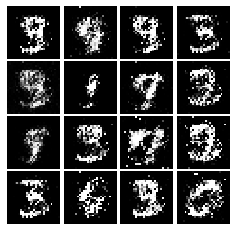

Epoch: 4, Iter: 2160, D: 1.35, G:1.127


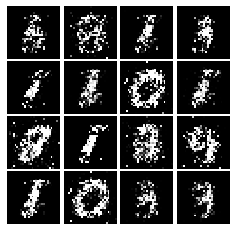

Epoch: 4, Iter: 2180, D: 1.305, G:0.9331


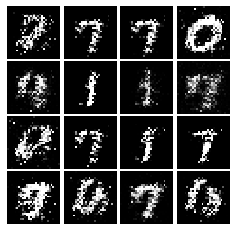

Epoch: 4, Iter: 2200, D: 1.294, G:0.9459


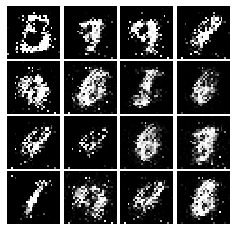

Epoch: 4, Iter: 2220, D: 1.136, G:0.9858


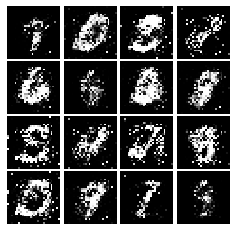

Epoch: 4, Iter: 2240, D: 1.241, G:0.8809


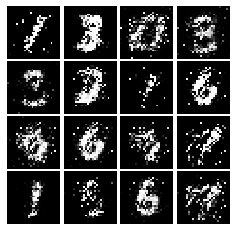

Epoch: 4, Iter: 2260, D: 1.132, G:1.179


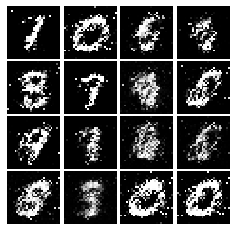

Epoch: 4, Iter: 2280, D: 1.299, G:0.9084


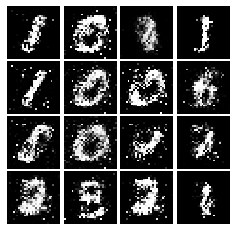

Epoch: 4, Iter: 2300, D: 1.219, G:0.9908


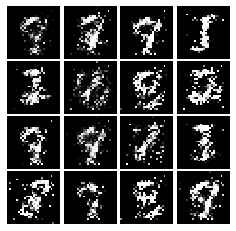

Epoch: 4, Iter: 2320, D: 1.358, G:1.163


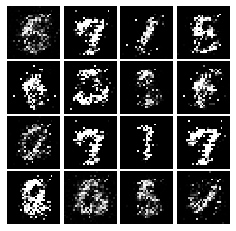

Epoch: 4, Iter: 2340, D: 1.173, G:1.051


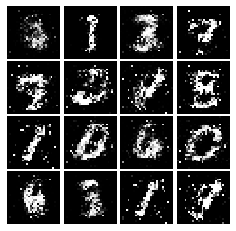

Epoch: 5, Iter: 2360, D: 1.257, G:0.9111


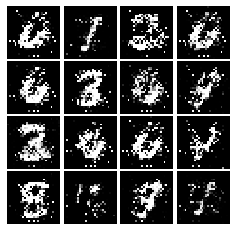

Epoch: 5, Iter: 2380, D: 1.275, G:0.9428


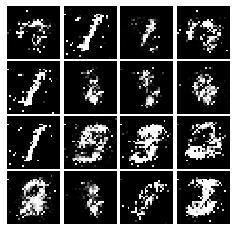

Epoch: 5, Iter: 2400, D: 1.194, G:0.9701


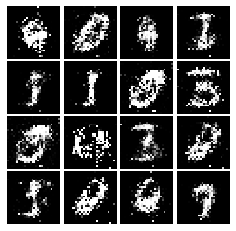

Epoch: 5, Iter: 2420, D: 1.25, G:0.885


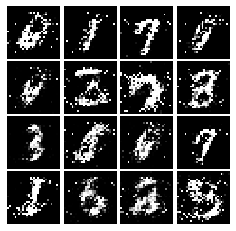

Epoch: 5, Iter: 2440, D: 1.13, G:0.9133


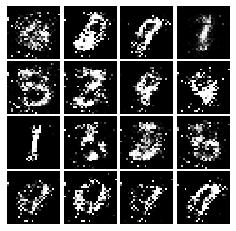

Epoch: 5, Iter: 2460, D: 1.11, G:1.154


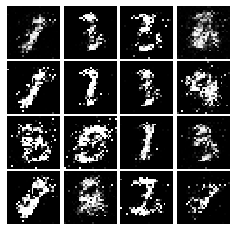

Epoch: 5, Iter: 2480, D: 1.126, G:1.054


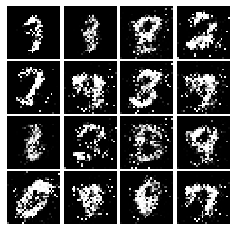

Epoch: 5, Iter: 2500, D: 1.245, G:0.9672


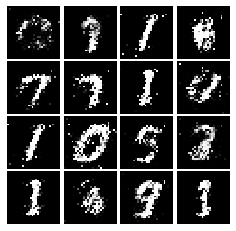

Epoch: 5, Iter: 2520, D: 1.351, G:0.9654


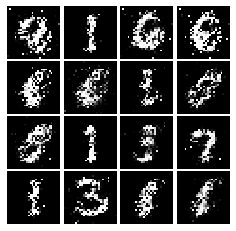

Epoch: 5, Iter: 2540, D: 1.354, G:0.9026


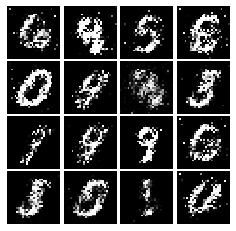

Epoch: 5, Iter: 2560, D: 1.274, G:0.9722


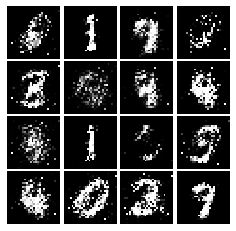

Epoch: 5, Iter: 2580, D: 1.379, G:0.8849


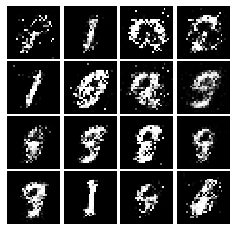

Epoch: 5, Iter: 2600, D: 1.457, G:0.7833


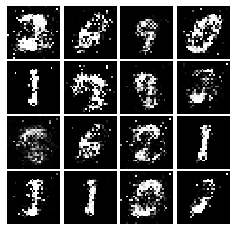

Epoch: 5, Iter: 2620, D: 1.218, G:0.8237


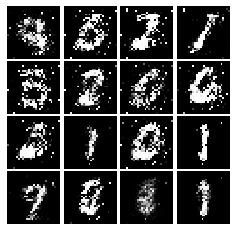

Epoch: 5, Iter: 2640, D: 1.273, G:0.8325


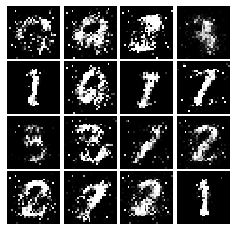

Epoch: 5, Iter: 2660, D: 1.091, G:1.095


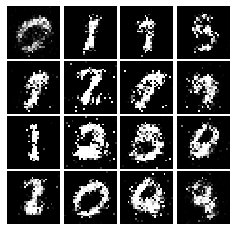

Epoch: 5, Iter: 2680, D: 1.461, G:0.7831


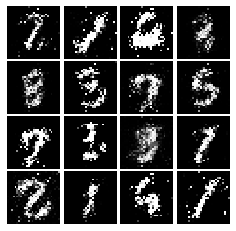

Epoch: 5, Iter: 2700, D: 1.496, G:0.7581


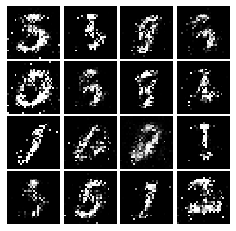

Epoch: 5, Iter: 2720, D: 1.38, G:1.339


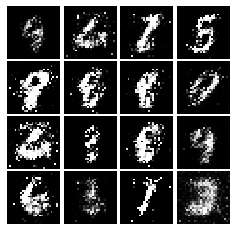

Epoch: 5, Iter: 2740, D: 1.26, G:0.8181


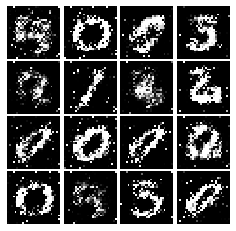

Epoch: 5, Iter: 2760, D: 1.26, G:0.8701


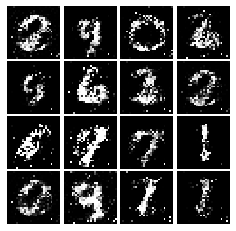

Epoch: 5, Iter: 2780, D: 1.168, G:0.8498


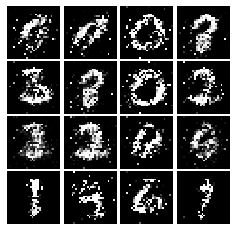

Epoch: 5, Iter: 2800, D: 1.36, G:0.829


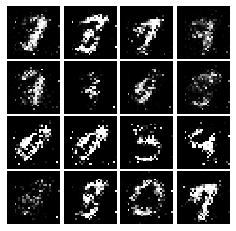

Epoch: 6, Iter: 2820, D: 1.255, G:0.91


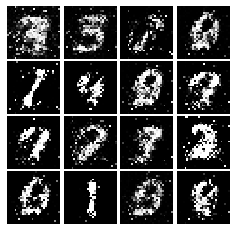

Epoch: 6, Iter: 2840, D: 1.292, G:0.9158


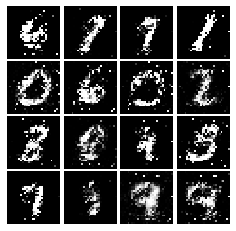

Epoch: 6, Iter: 2860, D: 1.354, G:0.8095


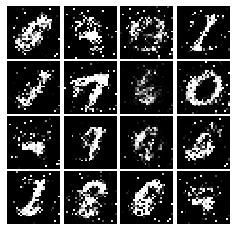

Epoch: 6, Iter: 2880, D: 1.267, G:0.7944


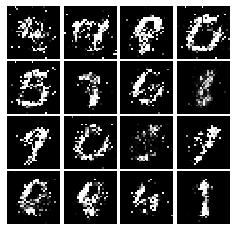

Epoch: 6, Iter: 2900, D: 1.311, G:1.122


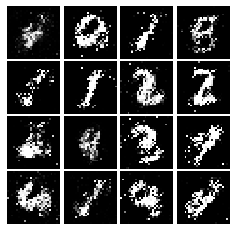

Epoch: 6, Iter: 2920, D: 1.334, G:0.9344


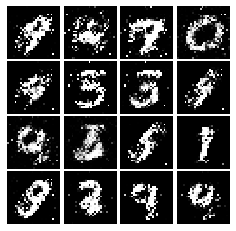

Epoch: 6, Iter: 2940, D: 1.278, G:0.8191


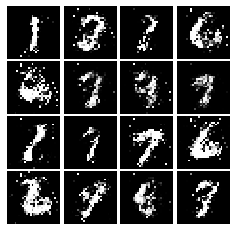

Epoch: 6, Iter: 2960, D: 1.303, G:0.7886


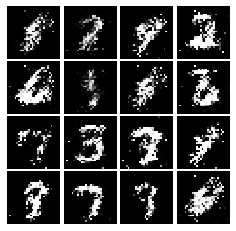

Epoch: 6, Iter: 2980, D: 1.264, G:0.8389


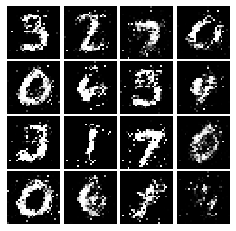

Epoch: 6, Iter: 3000, D: 1.328, G:0.7958


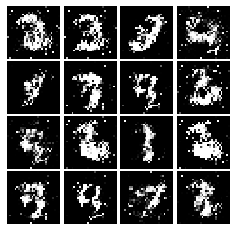

Epoch: 6, Iter: 3020, D: 1.322, G:1.053


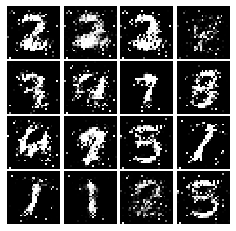

Epoch: 6, Iter: 3040, D: 1.29, G:0.7993


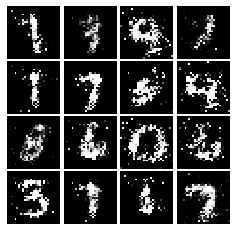

Epoch: 6, Iter: 3060, D: 1.39, G:0.8485


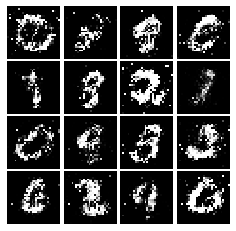

Epoch: 6, Iter: 3080, D: 1.397, G:0.819


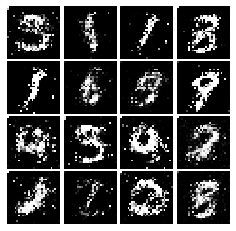

Epoch: 6, Iter: 3100, D: 1.387, G:0.7502


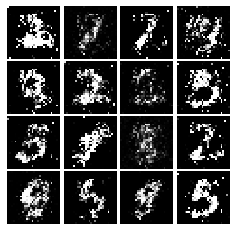

Epoch: 6, Iter: 3120, D: 1.207, G:0.8278


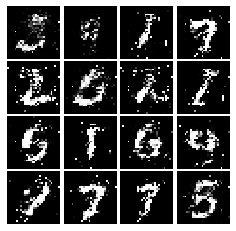

Epoch: 6, Iter: 3140, D: 1.328, G:0.8303


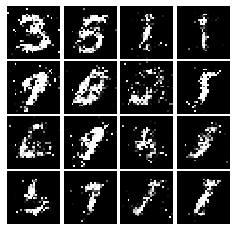

Epoch: 6, Iter: 3160, D: 1.347, G:0.6978


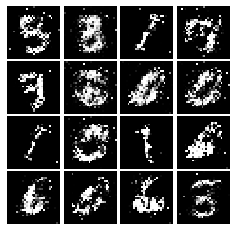

Epoch: 6, Iter: 3180, D: 1.308, G:1.103


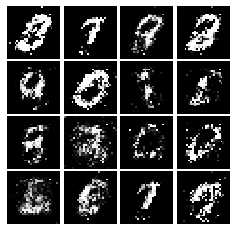

Epoch: 6, Iter: 3200, D: 1.322, G:0.7549


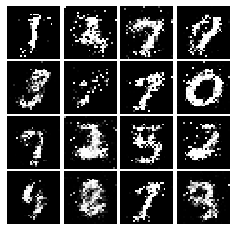

Epoch: 6, Iter: 3220, D: 1.367, G:0.8865


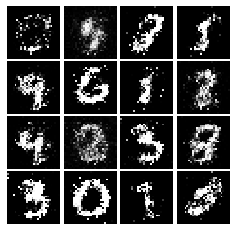

Epoch: 6, Iter: 3240, D: 1.34, G:0.8129


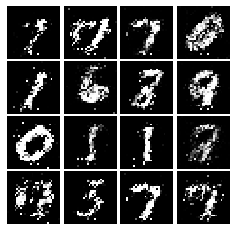

Epoch: 6, Iter: 3260, D: 1.514, G:1.023


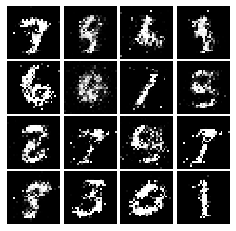

Epoch: 6, Iter: 3280, D: 1.351, G:0.7745


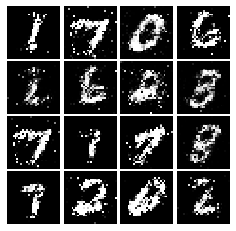

Epoch: 7, Iter: 3300, D: 1.294, G:0.8185


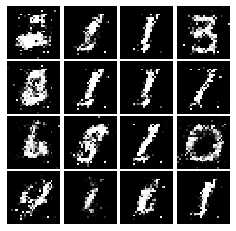

Epoch: 7, Iter: 3320, D: 1.273, G:0.9177


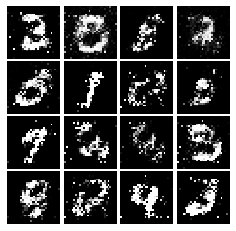

Epoch: 7, Iter: 3340, D: 1.453, G:0.7014


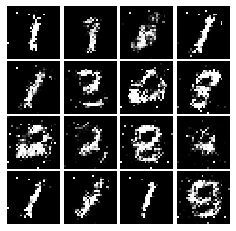

Epoch: 7, Iter: 3360, D: 1.373, G:0.7593


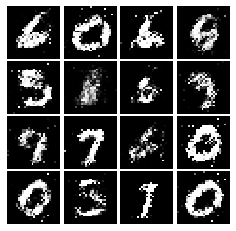

Epoch: 7, Iter: 3380, D: 1.298, G:0.7036


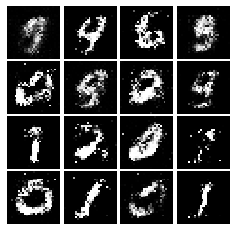

Epoch: 7, Iter: 3400, D: 1.494, G:0.7401


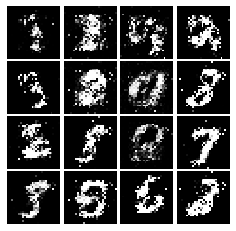

Epoch: 7, Iter: 3420, D: 1.312, G:0.9429


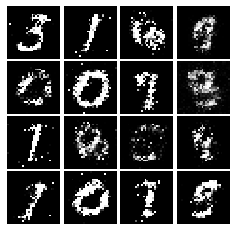

Epoch: 7, Iter: 3440, D: 1.269, G:0.9782


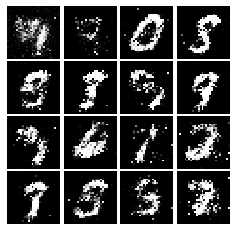

Epoch: 7, Iter: 3460, D: 1.289, G:0.7787


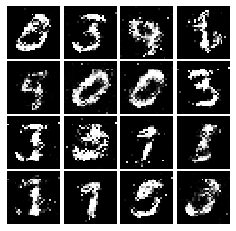

Epoch: 7, Iter: 3480, D: 1.389, G:0.777


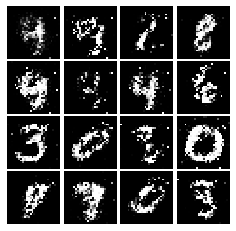

Epoch: 7, Iter: 3500, D: 1.354, G:0.8663


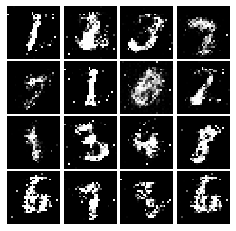

Epoch: 7, Iter: 3520, D: 1.392, G:0.7288


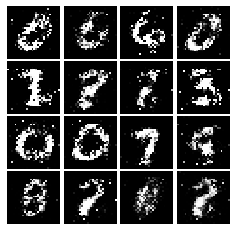

Epoch: 7, Iter: 3540, D: 1.204, G:0.7476


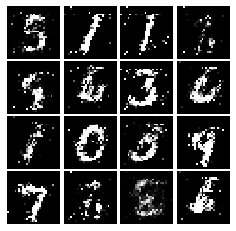

Epoch: 7, Iter: 3560, D: 1.308, G:0.7696


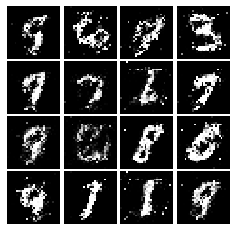

Epoch: 7, Iter: 3580, D: 1.331, G:0.7532


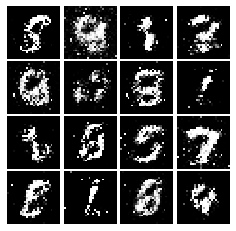

Epoch: 7, Iter: 3600, D: 1.337, G:0.8104


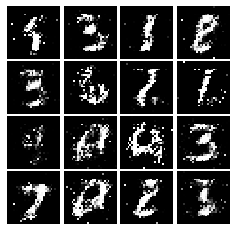

Epoch: 7, Iter: 3620, D: 1.285, G:0.7912


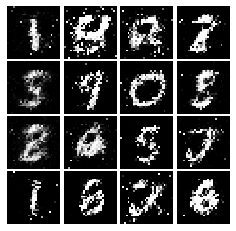

Epoch: 7, Iter: 3640, D: 1.388, G:0.7878


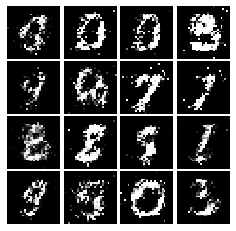

Epoch: 7, Iter: 3660, D: 1.458, G:0.7607


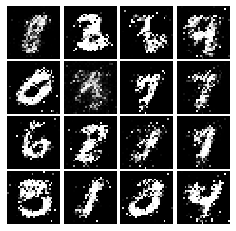

Epoch: 7, Iter: 3680, D: 1.282, G:0.8199


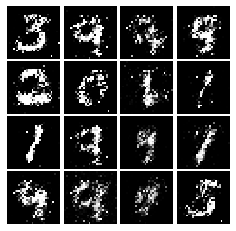

Epoch: 7, Iter: 3700, D: 1.342, G:0.8


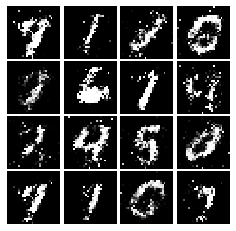

Epoch: 7, Iter: 3720, D: 1.339, G:0.7819


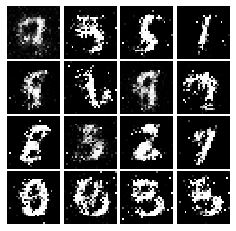

Epoch: 7, Iter: 3740, D: 1.367, G:0.7529


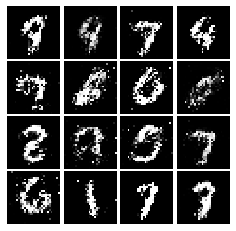

Epoch: 8, Iter: 3760, D: 1.309, G:0.8236


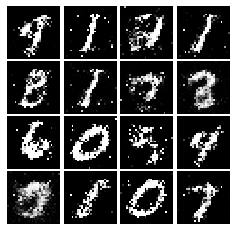

Epoch: 8, Iter: 3780, D: 1.345, G:0.7807


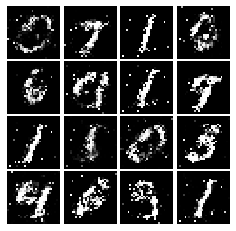

Epoch: 8, Iter: 3800, D: 1.238, G:0.8247


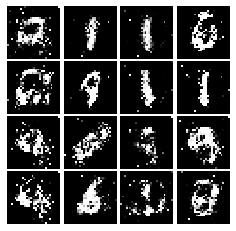

Epoch: 8, Iter: 3820, D: 1.33, G:0.8518


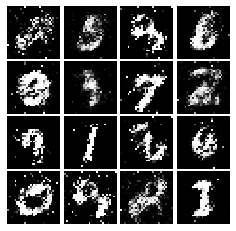

Epoch: 8, Iter: 3840, D: 1.331, G:0.797


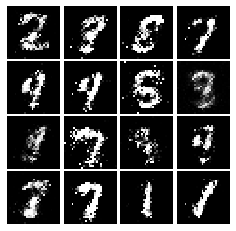

Epoch: 8, Iter: 3860, D: 1.299, G:0.8845


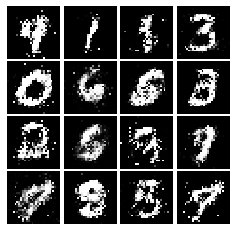

Epoch: 8, Iter: 3880, D: 1.339, G:0.6907


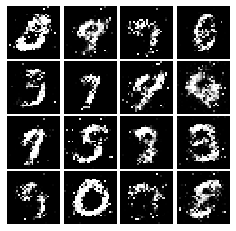

Epoch: 8, Iter: 3900, D: 1.378, G:0.7344


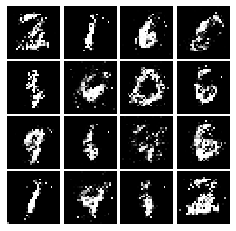

Epoch: 8, Iter: 3920, D: 1.219, G:0.9878


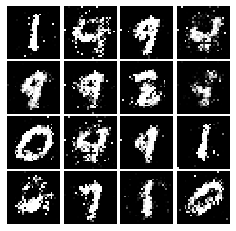

Epoch: 8, Iter: 3940, D: 1.333, G:0.7809


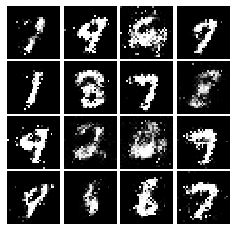

Epoch: 8, Iter: 3960, D: 1.378, G:0.8403


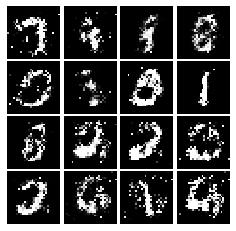

Epoch: 8, Iter: 3980, D: 1.375, G:0.7492


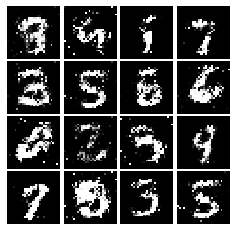

Epoch: 8, Iter: 4000, D: 1.267, G:0.8239


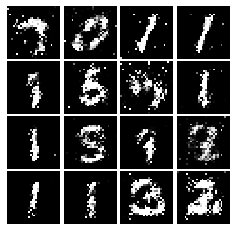

Epoch: 8, Iter: 4020, D: 1.403, G:0.8239


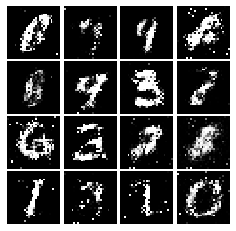

Epoch: 8, Iter: 4040, D: 1.301, G:0.7313


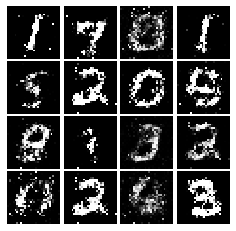

Epoch: 8, Iter: 4060, D: 1.393, G:0.86


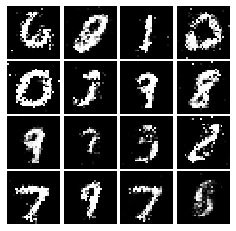

Epoch: 8, Iter: 4080, D: 1.431, G:0.7575


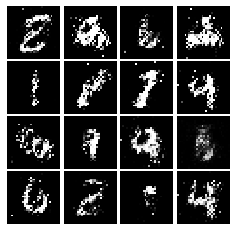

Epoch: 8, Iter: 4100, D: 1.379, G:0.8639


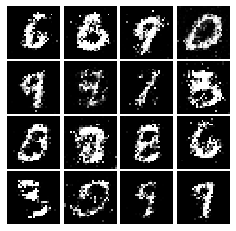

Epoch: 8, Iter: 4120, D: 1.305, G:0.7951


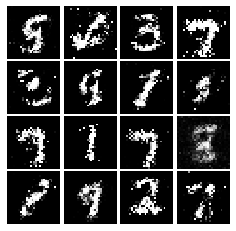

Epoch: 8, Iter: 4140, D: 1.395, G:0.771


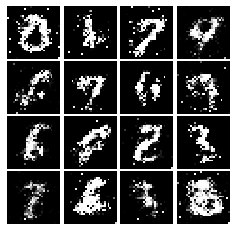

Epoch: 8, Iter: 4160, D: 1.409, G:0.8444


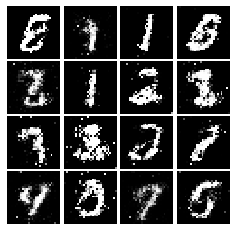

Epoch: 8, Iter: 4180, D: 1.317, G:0.7086


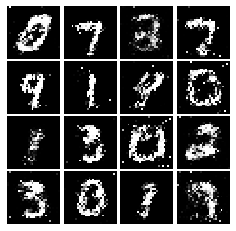

Epoch: 8, Iter: 4200, D: 1.363, G:0.7676


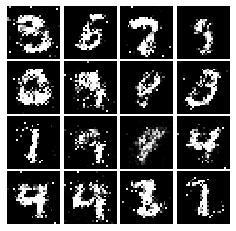

Epoch: 8, Iter: 4220, D: 1.379, G:0.8277


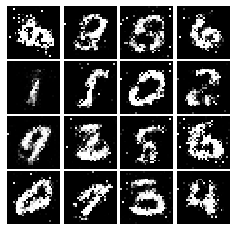

Epoch: 9, Iter: 4240, D: 1.314, G:0.8336


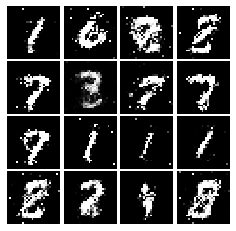

Epoch: 9, Iter: 4260, D: 1.317, G:0.8454


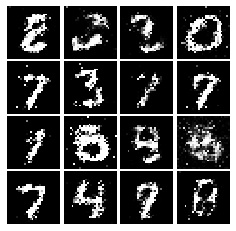

Epoch: 9, Iter: 4280, D: 1.421, G:1.011


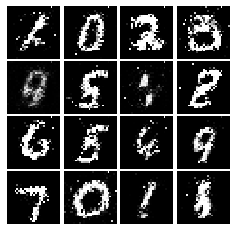

Epoch: 9, Iter: 4300, D: 1.431, G:0.8393


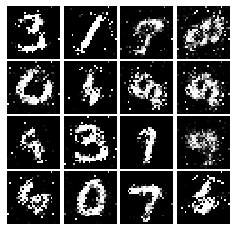

Epoch: 9, Iter: 4320, D: 1.46, G:0.5679


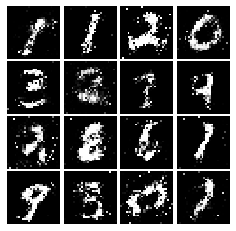

Epoch: 9, Iter: 4340, D: 1.346, G:1.024


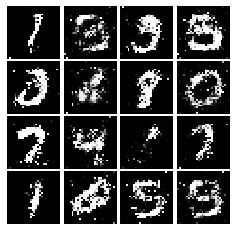

Epoch: 9, Iter: 4360, D: 1.342, G:0.8563


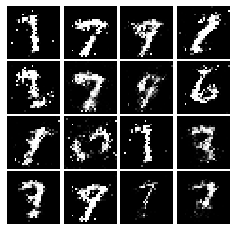

Epoch: 9, Iter: 4380, D: 1.393, G:0.7401


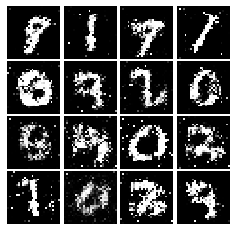

Epoch: 9, Iter: 4400, D: 1.23, G:0.8098


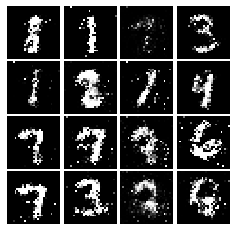

Epoch: 9, Iter: 4420, D: 1.322, G:0.8771


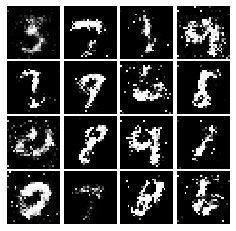

Epoch: 9, Iter: 4440, D: 1.338, G:0.7757


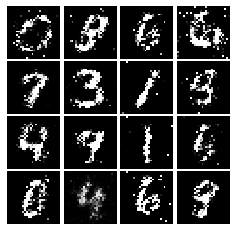

Epoch: 9, Iter: 4460, D: 1.352, G:0.7226


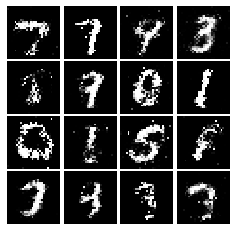

Epoch: 9, Iter: 4480, D: 1.287, G:0.8183


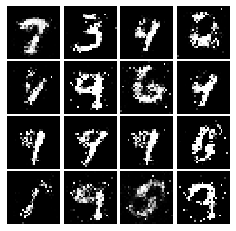

Epoch: 9, Iter: 4500, D: 1.41, G:0.7454


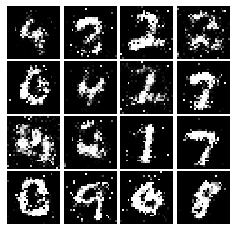

Epoch: 9, Iter: 4520, D: 1.367, G:0.8684


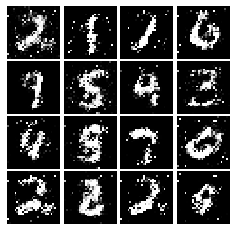

Epoch: 9, Iter: 4540, D: 1.359, G:0.7114


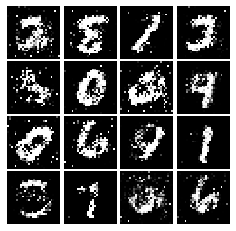

Epoch: 9, Iter: 4560, D: 1.317, G:0.8086


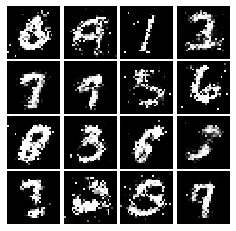

Epoch: 9, Iter: 4580, D: 1.355, G:0.7191


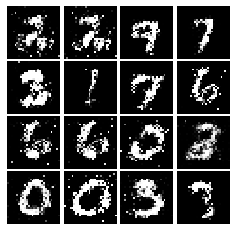

Epoch: 9, Iter: 4600, D: 1.377, G:0.7684


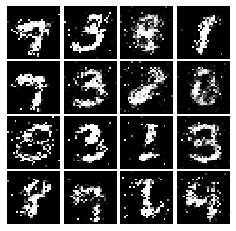

Epoch: 9, Iter: 4620, D: 1.407, G:0.7415


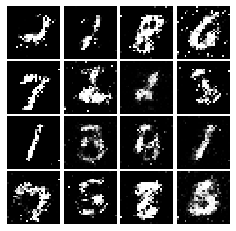

Epoch: 9, Iter: 4640, D: 1.341, G:0.7724


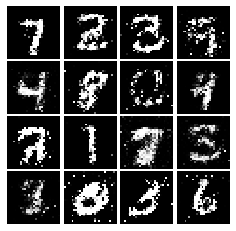

Epoch: 9, Iter: 4660, D: 1.469, G:0.8175


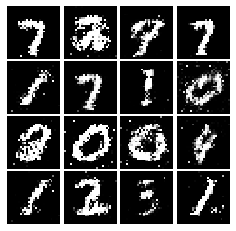

Epoch: 9, Iter: 4680, D: 1.386, G:0.7331


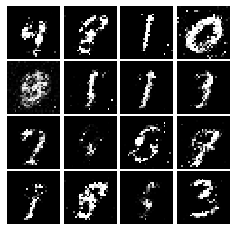

Final images


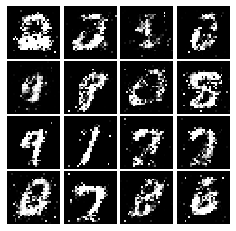

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [18]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * (tf.reduce_mean((scores_real - 1) ** 2) + tf.reduce_mean((scores_fake ** 2)))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean((scores_fake - 1) ** 2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [19]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.1277, G:0.4393


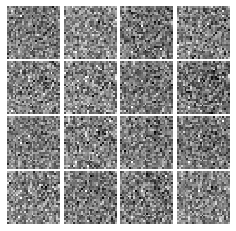

Epoch: 0, Iter: 20, D: 0.06018, G:1.237


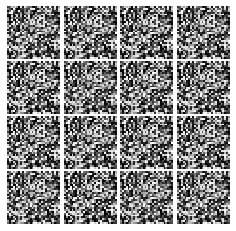

Epoch: 0, Iter: 40, D: 0.2135, G:0.986


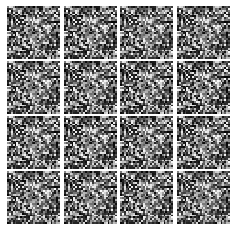

Epoch: 0, Iter: 60, D: 0.07778, G:0.62


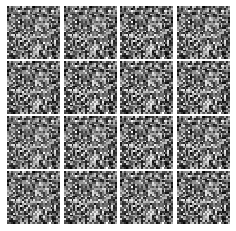

Epoch: 0, Iter: 80, D: 0.03411, G:0.9166


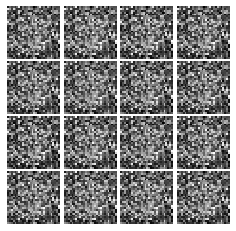

Epoch: 0, Iter: 100, D: 0.1958, G:1.346


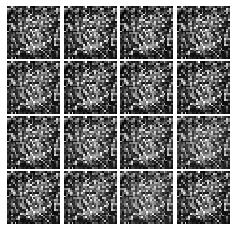

Epoch: 0, Iter: 120, D: 0.1292, G:0.3981


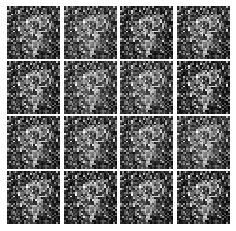

Epoch: 0, Iter: 140, D: 0.1258, G:0.5088


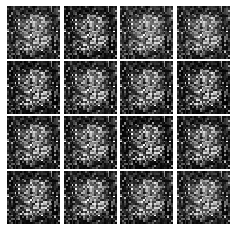

Epoch: 0, Iter: 160, D: 0.1531, G:0.23


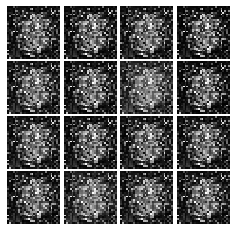

Epoch: 0, Iter: 180, D: 0.698, G:0.003436


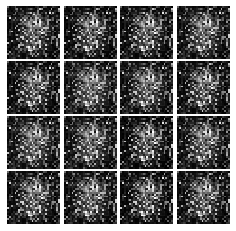

Epoch: 0, Iter: 200, D: 0.1363, G:0.3701


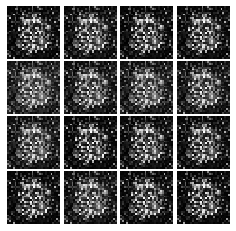

Epoch: 0, Iter: 220, D: 0.2445, G:0.3897


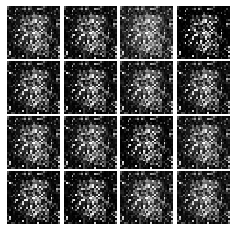

Epoch: 0, Iter: 240, D: 0.1693, G:0.2967


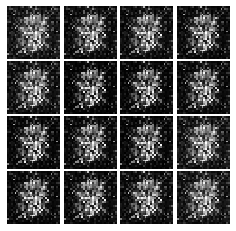

Epoch: 0, Iter: 260, D: 0.3567, G:0.05283


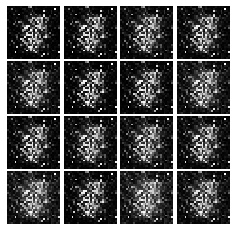

Epoch: 0, Iter: 280, D: 0.2583, G:0.3218


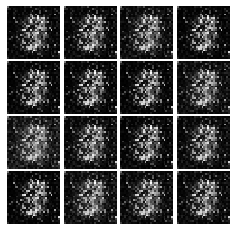

Epoch: 0, Iter: 300, D: 0.6439, G:0.7502


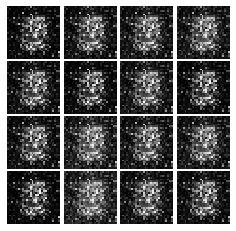

Epoch: 0, Iter: 320, D: 0.1635, G:0.3397


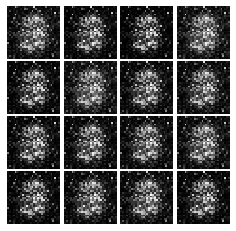

Epoch: 0, Iter: 340, D: 0.167, G:0.866


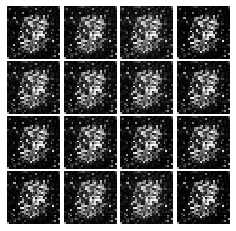

Epoch: 0, Iter: 360, D: 0.1088, G:0.3307


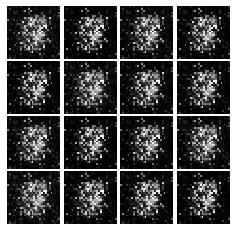

Epoch: 0, Iter: 380, D: 0.08196, G:0.4502


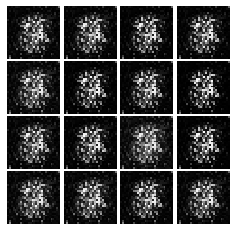

Epoch: 0, Iter: 400, D: 0.2424, G:0.525


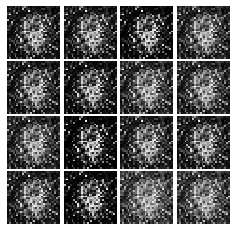

Epoch: 0, Iter: 420, D: 0.5561, G:1.406


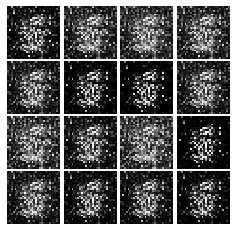

Epoch: 0, Iter: 440, D: 0.2218, G:0.3939


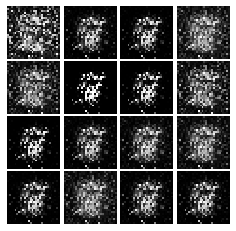

Epoch: 0, Iter: 460, D: 0.07323, G:0.5465


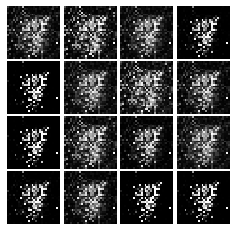

Epoch: 1, Iter: 480, D: 0.2794, G:0.2203


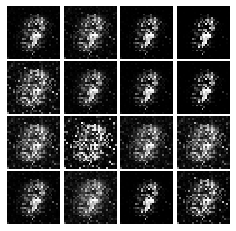

Epoch: 1, Iter: 500, D: 0.08023, G:0.5189


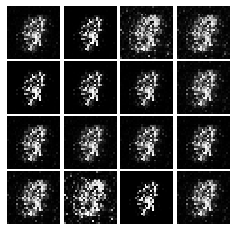

Epoch: 1, Iter: 520, D: 0.07284, G:0.501


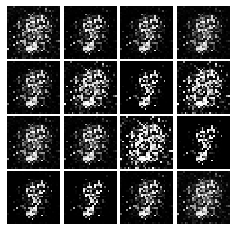

Epoch: 1, Iter: 540, D: 0.1969, G:0.2604


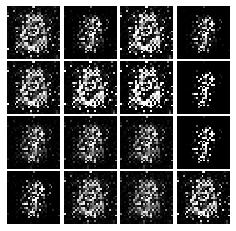

Epoch: 1, Iter: 560, D: 0.1103, G:0.4834


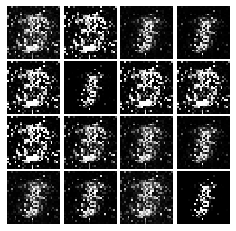

Epoch: 1, Iter: 580, D: 0.09642, G:0.4019


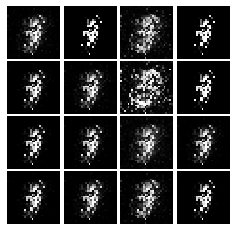

Epoch: 1, Iter: 600, D: 0.07059, G:0.3991


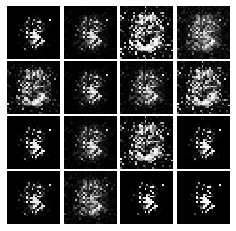

Epoch: 1, Iter: 620, D: 0.07408, G:0.4173


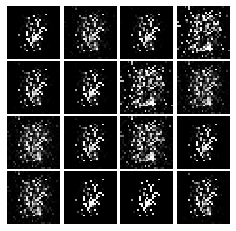

Epoch: 1, Iter: 640, D: 0.07448, G:0.5413


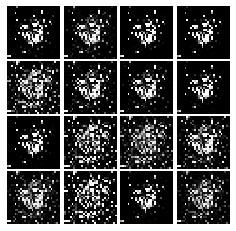

Epoch: 1, Iter: 660, D: 0.1823, G:0.2429


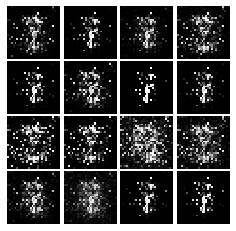

Epoch: 1, Iter: 680, D: 0.1153, G:0.4225


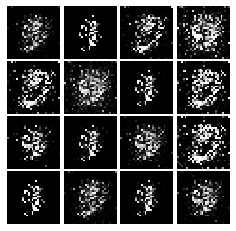

Epoch: 1, Iter: 700, D: 0.1935, G:0.2897


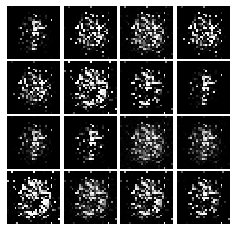

Epoch: 1, Iter: 720, D: 0.1424, G:0.3734


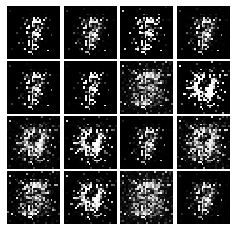

Epoch: 1, Iter: 740, D: 0.1262, G:0.3211


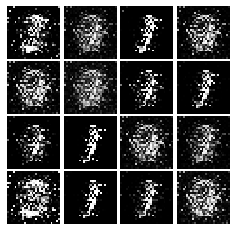

Epoch: 1, Iter: 760, D: 0.2889, G:0.3026


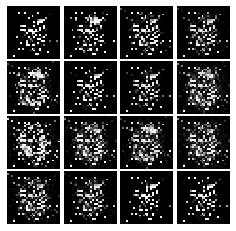

Epoch: 1, Iter: 780, D: 0.1164, G:0.3998


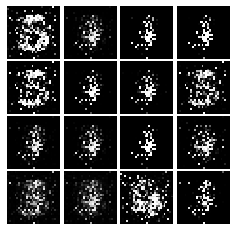

Epoch: 1, Iter: 800, D: 0.07252, G:0.5863


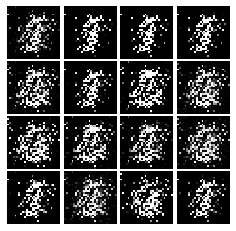

Epoch: 1, Iter: 820, D: 0.126, G:0.5172


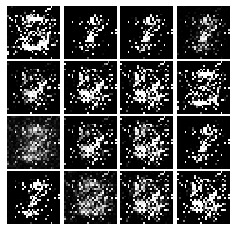

Epoch: 1, Iter: 840, D: 0.1042, G:0.3978


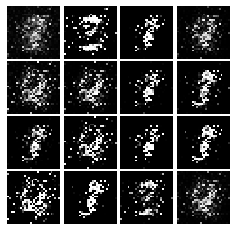

Epoch: 1, Iter: 860, D: 0.1567, G:0.6369


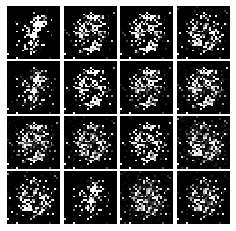

Epoch: 1, Iter: 880, D: 0.06881, G:0.5076


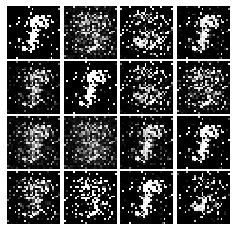

Epoch: 1, Iter: 900, D: 0.08865, G:0.3836


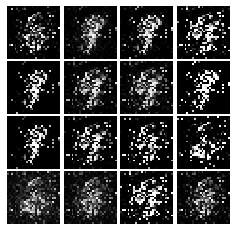

Epoch: 1, Iter: 920, D: 0.1197, G:0.3108


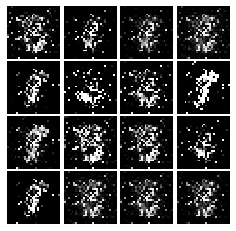

Epoch: 2, Iter: 940, D: 0.2583, G:0.624


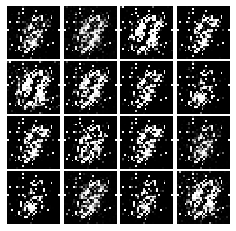

Epoch: 2, Iter: 960, D: 0.2627, G:0.06379


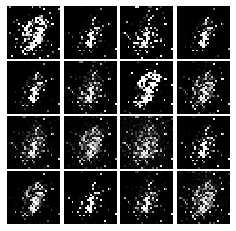

Epoch: 2, Iter: 980, D: 0.0684, G:0.5238


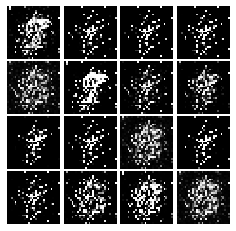

Epoch: 2, Iter: 1000, D: 0.1204, G:0.6779


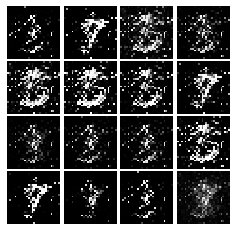

Epoch: 2, Iter: 1020, D: 0.05947, G:0.5244


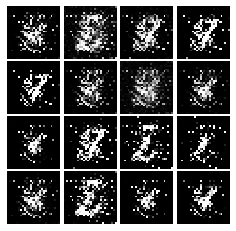

Epoch: 2, Iter: 1040, D: 0.1651, G:0.2311


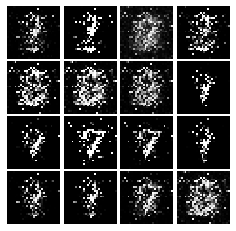

Epoch: 2, Iter: 1060, D: 0.137, G:0.4083


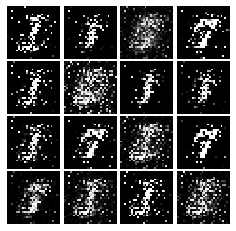

Epoch: 2, Iter: 1080, D: 0.1361, G:0.4827


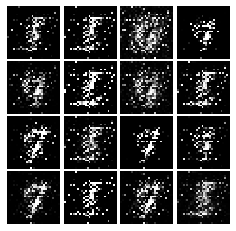

Epoch: 2, Iter: 1100, D: 0.1323, G:0.3351


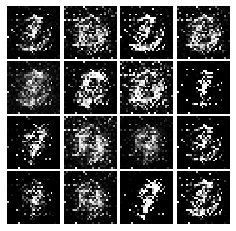

Epoch: 2, Iter: 1120, D: 0.3615, G:0.0518


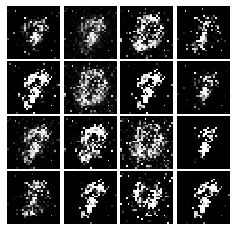

Epoch: 2, Iter: 1140, D: 0.1574, G:0.2755


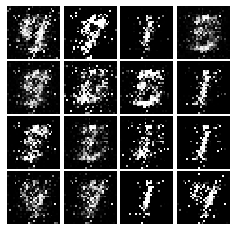

Epoch: 2, Iter: 1160, D: 0.151, G:0.2664


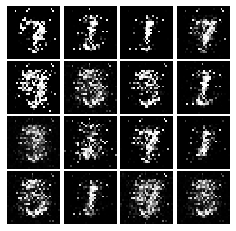

Epoch: 2, Iter: 1180, D: 0.1639, G:0.3506


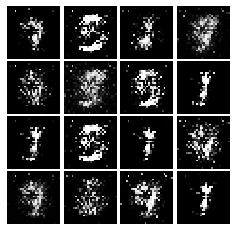

Epoch: 2, Iter: 1200, D: 0.1514, G:0.2416


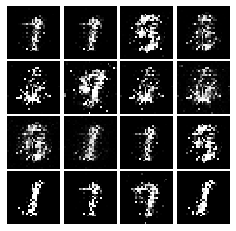

Epoch: 2, Iter: 1220, D: 0.2061, G:0.6632


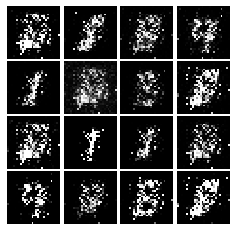

Epoch: 2, Iter: 1240, D: 0.1363, G:0.2546


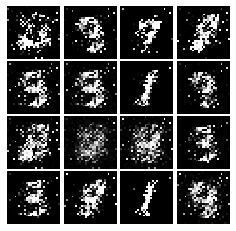

Epoch: 2, Iter: 1260, D: 0.1548, G:0.05597


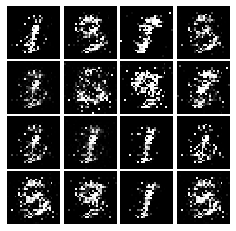

Epoch: 2, Iter: 1280, D: 0.171, G:0.3955


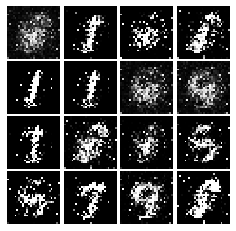

Epoch: 2, Iter: 1300, D: 0.1402, G:0.3493


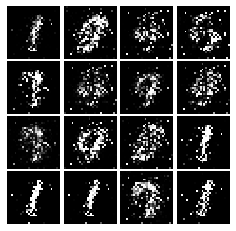

Epoch: 2, Iter: 1320, D: 0.1897, G:0.2635


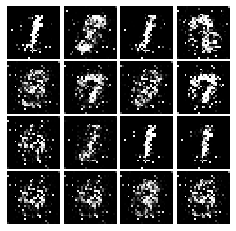

Epoch: 2, Iter: 1340, D: 0.1562, G:0.2838


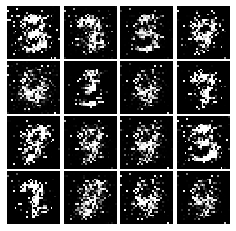

Epoch: 2, Iter: 1360, D: 0.304, G:0.2228


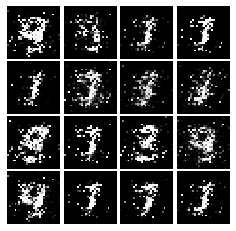

Epoch: 2, Iter: 1380, D: 0.1775, G:0.2664


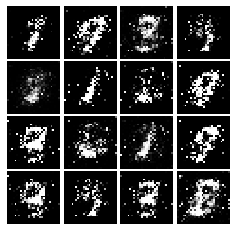

Epoch: 2, Iter: 1400, D: 0.1694, G:0.4269


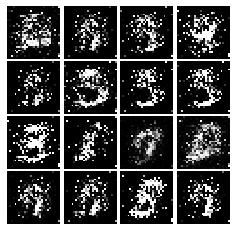

Epoch: 3, Iter: 1420, D: 0.2044, G:0.2515


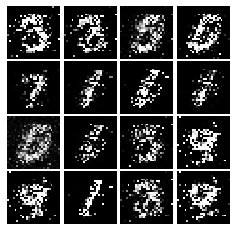

Epoch: 3, Iter: 1440, D: 0.1466, G:0.2492


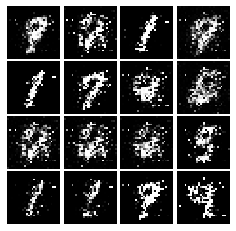

Epoch: 3, Iter: 1460, D: 0.2008, G:0.271


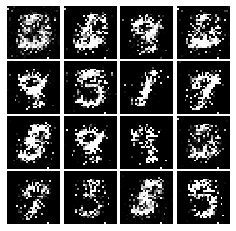

Epoch: 3, Iter: 1480, D: 0.2194, G:0.1842


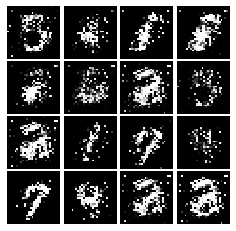

Epoch: 3, Iter: 1500, D: 0.2011, G:0.1956


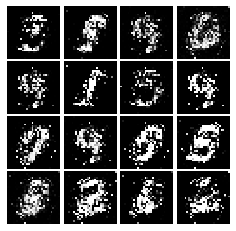

Epoch: 3, Iter: 1520, D: 0.2029, G:0.2735


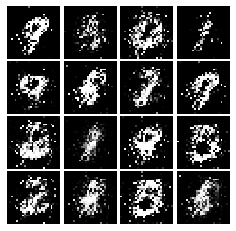

Epoch: 3, Iter: 1540, D: 0.1767, G:0.2427


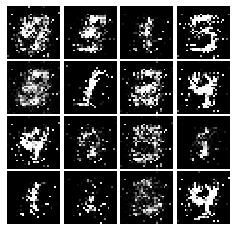

Epoch: 3, Iter: 1560, D: 0.1496, G:0.2738


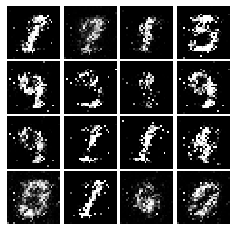

Epoch: 3, Iter: 1580, D: 0.2124, G:0.2969


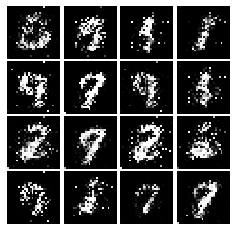

Epoch: 3, Iter: 1600, D: 0.1717, G:0.2959


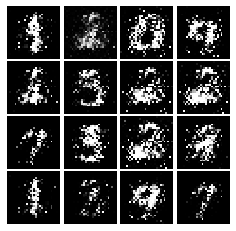

Epoch: 3, Iter: 1620, D: 0.1803, G:0.2522


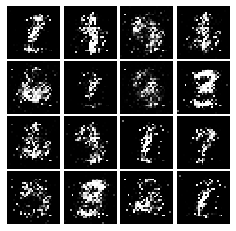

Epoch: 3, Iter: 1640, D: 0.1783, G:0.2526


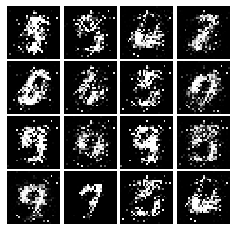

Epoch: 3, Iter: 1660, D: 0.1585, G:0.2932


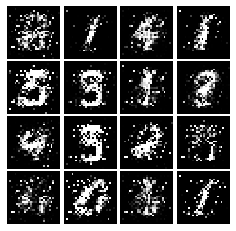

Epoch: 3, Iter: 1680, D: 0.1796, G:0.2472


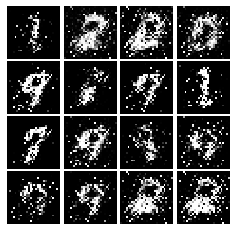

Epoch: 3, Iter: 1700, D: 0.2252, G:0.2928


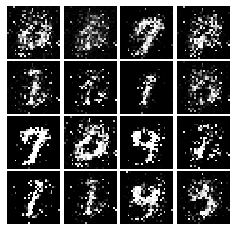

Epoch: 3, Iter: 1720, D: 0.1853, G:0.2933


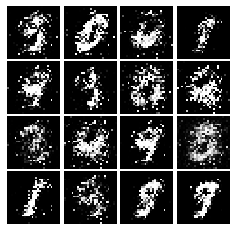

Epoch: 3, Iter: 1740, D: 0.2149, G:0.3424


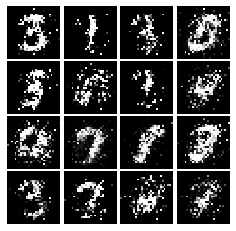

Epoch: 3, Iter: 1760, D: 0.2102, G:0.2416


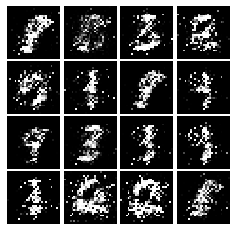

Epoch: 3, Iter: 1780, D: 0.1678, G:0.1975


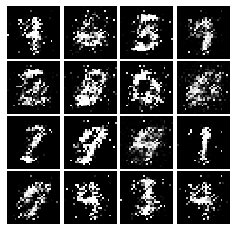

Epoch: 3, Iter: 1800, D: 0.2161, G:0.2362


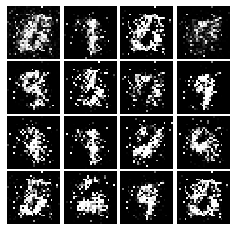

Epoch: 3, Iter: 1820, D: 0.2019, G:0.2087


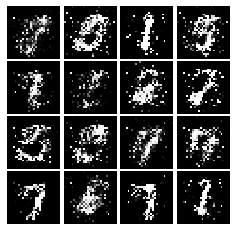

Epoch: 3, Iter: 1840, D: 0.1709, G:0.3026


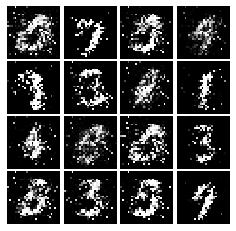

Epoch: 3, Iter: 1860, D: 0.2525, G:0.2118


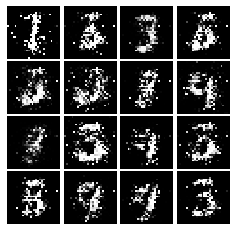

Epoch: 4, Iter: 1880, D: 0.2029, G:0.195


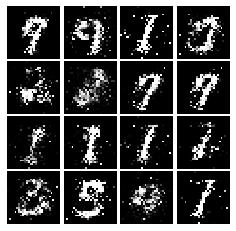

Epoch: 4, Iter: 1900, D: 0.1941, G:0.1962


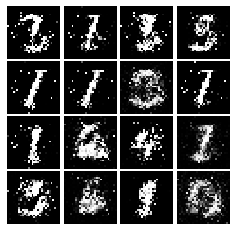

Epoch: 4, Iter: 1920, D: 0.1746, G:0.2292


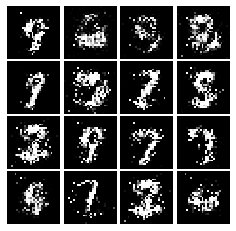

Epoch: 4, Iter: 1940, D: 0.1871, G:0.2421


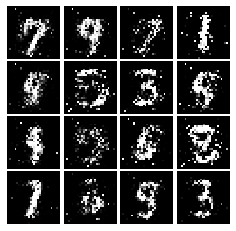

Epoch: 4, Iter: 1960, D: 0.2129, G:0.2442


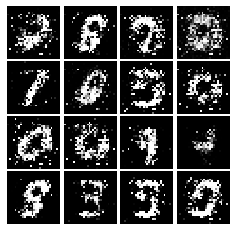

Epoch: 4, Iter: 1980, D: 0.1948, G:0.2362


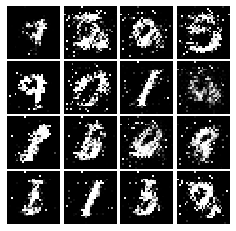

Epoch: 4, Iter: 2000, D: 0.3967, G:0.2767


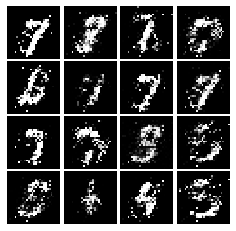

Epoch: 4, Iter: 2020, D: 0.1965, G:0.212


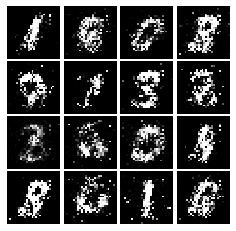

Epoch: 4, Iter: 2040, D: 0.2076, G:0.1944


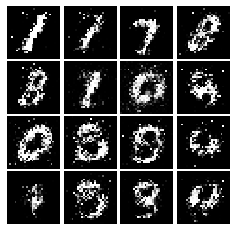

Epoch: 4, Iter: 2060, D: 0.2198, G:0.1742


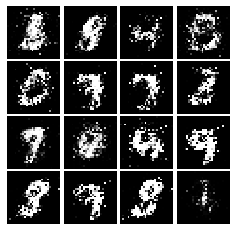

Epoch: 4, Iter: 2080, D: 0.2087, G:0.2126


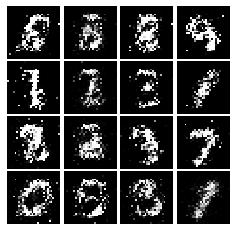

Epoch: 4, Iter: 2100, D: 0.1957, G:0.1883


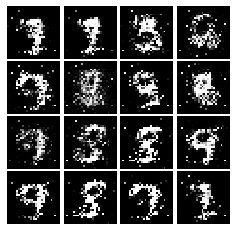

Epoch: 4, Iter: 2120, D: 0.1945, G:0.2283


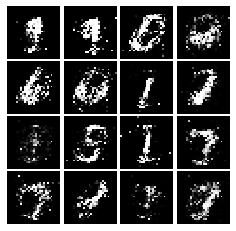

Epoch: 4, Iter: 2140, D: 0.1945, G:0.2113


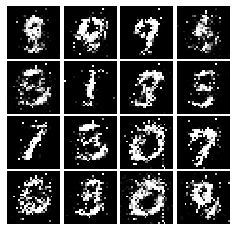

Epoch: 4, Iter: 2160, D: 0.2314, G:0.192


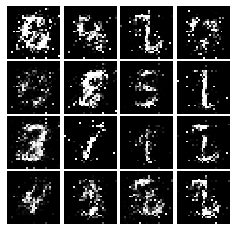

Epoch: 4, Iter: 2180, D: 0.1995, G:0.1957


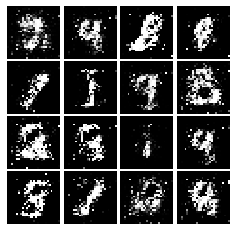

Epoch: 4, Iter: 2200, D: 0.1787, G:0.2275


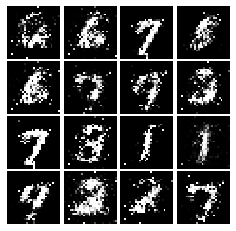

Epoch: 4, Iter: 2220, D: 0.2039, G:0.2513


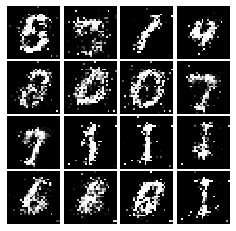

Epoch: 4, Iter: 2240, D: 0.2215, G:0.2497


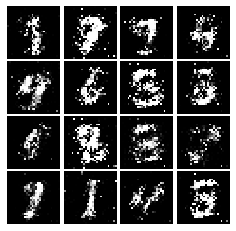

Epoch: 4, Iter: 2260, D: 0.2274, G:0.2486


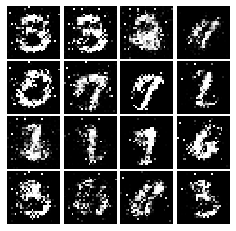

Epoch: 4, Iter: 2280, D: 0.2005, G:0.2219


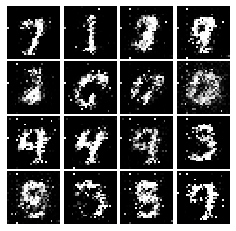

Epoch: 4, Iter: 2300, D: 0.204, G:0.2358


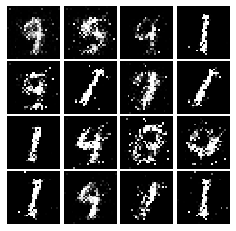

Epoch: 4, Iter: 2320, D: 0.1945, G:0.245


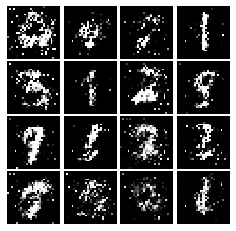

Epoch: 4, Iter: 2340, D: 0.2208, G:0.2117


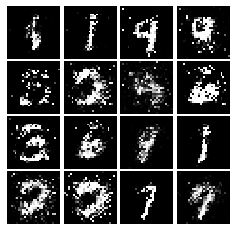

Epoch: 5, Iter: 2360, D: 0.2068, G:0.2821


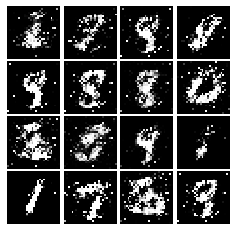

Epoch: 5, Iter: 2380, D: 0.285, G:0.2577


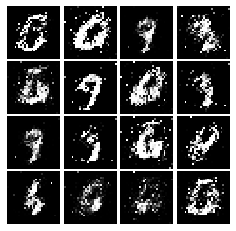

Epoch: 5, Iter: 2400, D: 0.1856, G:0.2178


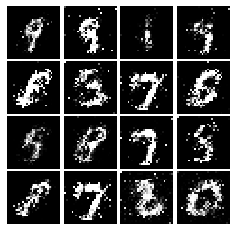

Epoch: 5, Iter: 2420, D: 0.177, G:0.2376


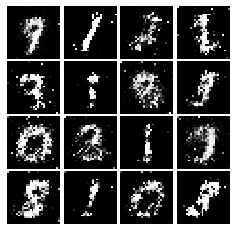

Epoch: 5, Iter: 2440, D: 0.22, G:0.191


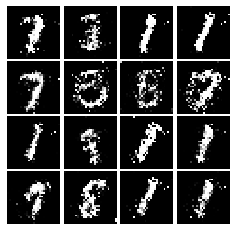

Epoch: 5, Iter: 2460, D: 0.1781, G:0.2849


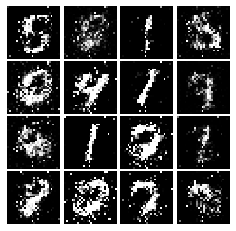

Epoch: 5, Iter: 2480, D: 0.2013, G:0.2101


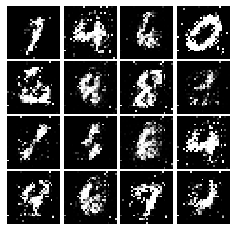

Epoch: 5, Iter: 2500, D: 0.1863, G:0.2589


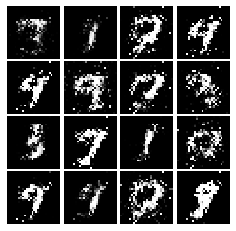

Epoch: 5, Iter: 2520, D: 0.2349, G:0.1851


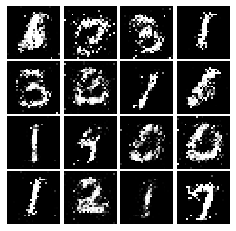

Epoch: 5, Iter: 2540, D: 0.2386, G:0.1894


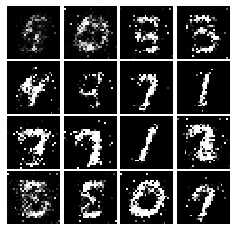

Epoch: 5, Iter: 2560, D: 0.2376, G:0.2103


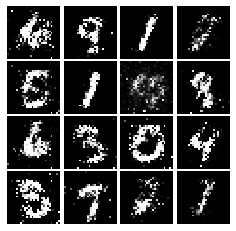

Epoch: 5, Iter: 2580, D: 0.214, G:0.2092


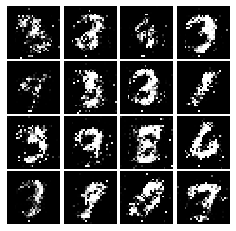

Epoch: 5, Iter: 2600, D: 0.2267, G:0.1835


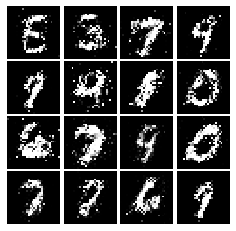

Epoch: 5, Iter: 2620, D: 0.2195, G:0.1972


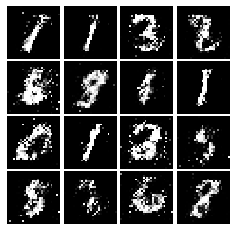

Epoch: 5, Iter: 2640, D: 0.2224, G:0.1947


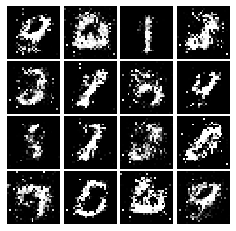

Epoch: 5, Iter: 2660, D: 0.214, G:0.1886


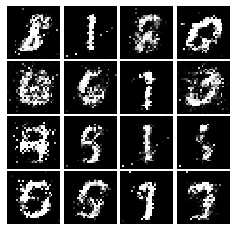

Epoch: 5, Iter: 2680, D: 0.2332, G:0.1817


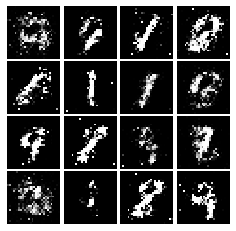

Epoch: 5, Iter: 2700, D: 0.2402, G:0.1717


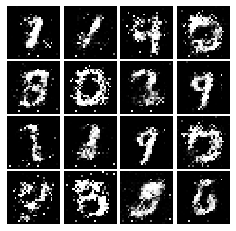

Epoch: 5, Iter: 2720, D: 0.2266, G:0.196


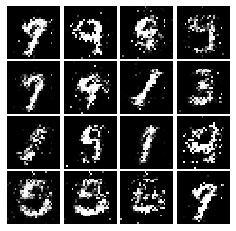

Epoch: 5, Iter: 2740, D: 0.2316, G:0.1604


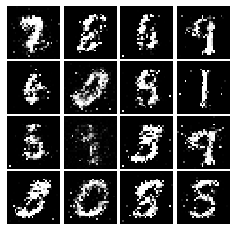

Epoch: 5, Iter: 2760, D: 0.2207, G:0.1828


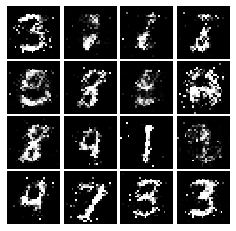

Epoch: 5, Iter: 2780, D: 0.2075, G:0.1831


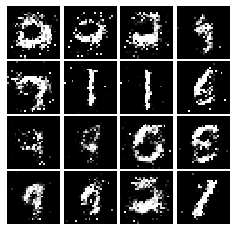

Epoch: 5, Iter: 2800, D: 0.174, G:0.2126


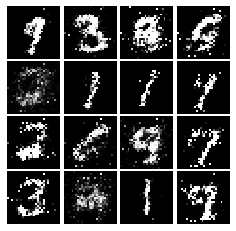

Epoch: 6, Iter: 2820, D: 0.2206, G:0.1949


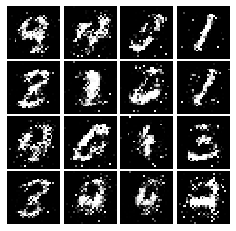

Epoch: 6, Iter: 2840, D: 0.2082, G:0.2309


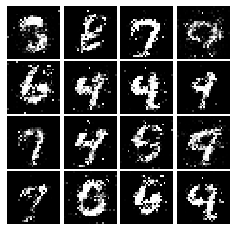

Epoch: 6, Iter: 2860, D: 0.2214, G:0.1942


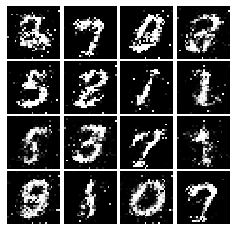

Epoch: 6, Iter: 2880, D: 0.2019, G:0.2055


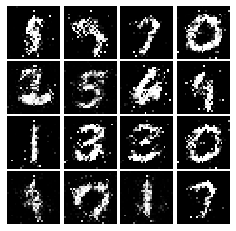

Epoch: 6, Iter: 2900, D: 0.2179, G:0.1924


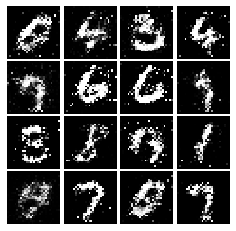

Epoch: 6, Iter: 2920, D: 0.2281, G:0.2047


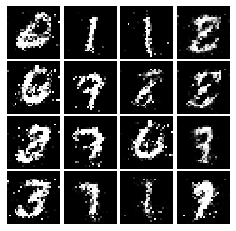

Epoch: 6, Iter: 2940, D: 0.246, G:0.1903


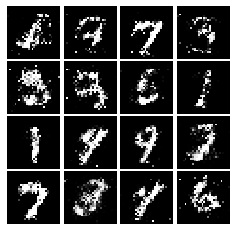

Epoch: 6, Iter: 2960, D: 0.2424, G:0.1798


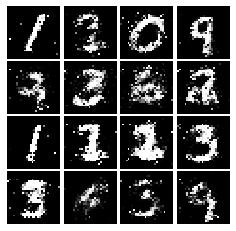

Epoch: 6, Iter: 2980, D: 0.2364, G:0.1611


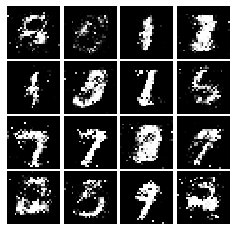

Epoch: 6, Iter: 3000, D: 0.2134, G:0.183


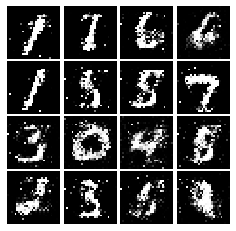

Epoch: 6, Iter: 3020, D: 0.2398, G:0.1956


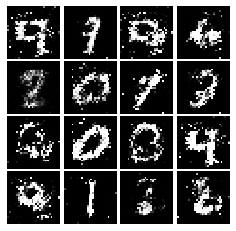

Epoch: 6, Iter: 3040, D: 0.234, G:0.1954


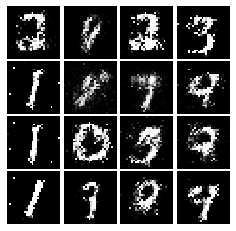

Epoch: 6, Iter: 3060, D: 0.2308, G:0.1699


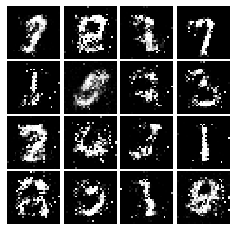

Epoch: 6, Iter: 3080, D: 0.2272, G:0.1786


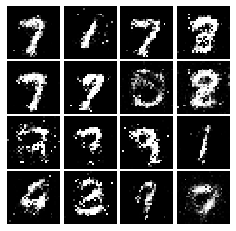

Epoch: 6, Iter: 3100, D: 0.1982, G:0.1947


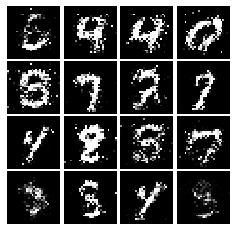

Epoch: 6, Iter: 3120, D: 0.2123, G:0.1745


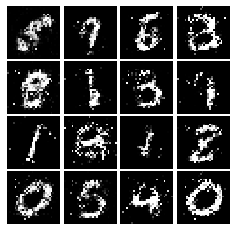

Epoch: 6, Iter: 3140, D: 0.213, G:0.1847


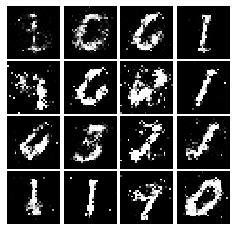

Epoch: 6, Iter: 3160, D: 0.207, G:0.2011


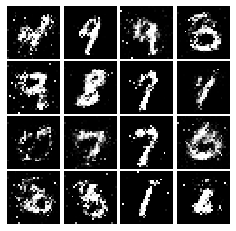

Epoch: 6, Iter: 3180, D: 0.2252, G:0.176


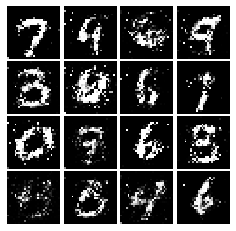

Epoch: 6, Iter: 3200, D: 0.2424, G:0.1786


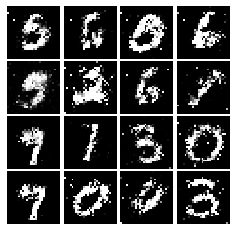

Epoch: 6, Iter: 3220, D: 0.222, G:0.1961


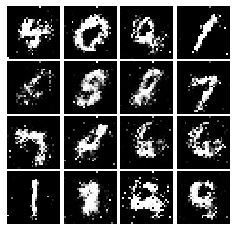

Epoch: 6, Iter: 3240, D: 0.2274, G:0.1658


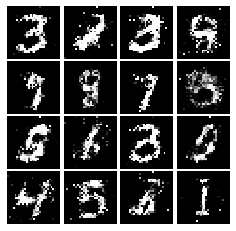

Epoch: 6, Iter: 3260, D: 0.2241, G:0.1394


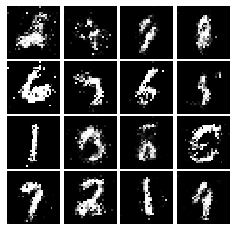

Epoch: 6, Iter: 3280, D: 0.2186, G:0.1873


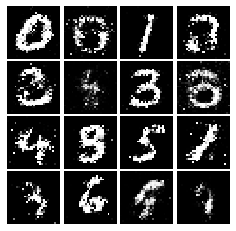

Epoch: 7, Iter: 3300, D: 0.2011, G:0.2226


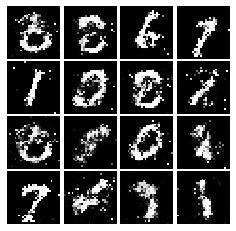

Epoch: 7, Iter: 3320, D: 0.2052, G:0.1669


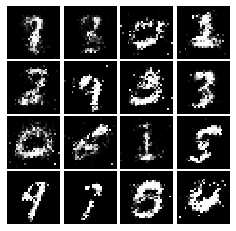

Epoch: 7, Iter: 3340, D: 0.228, G:0.1857


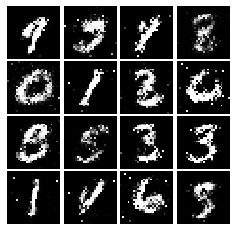

Epoch: 7, Iter: 3360, D: 0.2407, G:0.1771


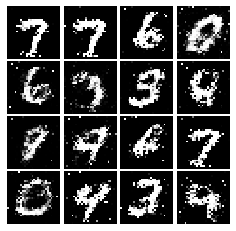

Epoch: 7, Iter: 3380, D: 0.2331, G:0.1773


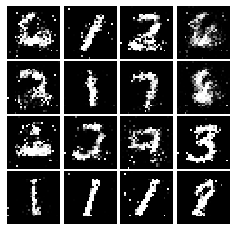

Epoch: 7, Iter: 3400, D: 0.2287, G:0.1773


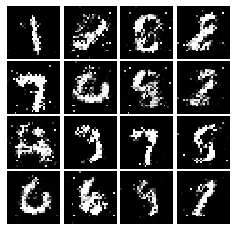

Epoch: 7, Iter: 3420, D: 0.2343, G:0.1714


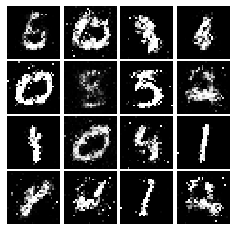

Epoch: 7, Iter: 3440, D: 0.2682, G:0.1467


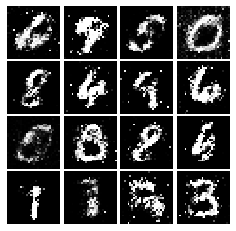

Epoch: 7, Iter: 3460, D: 0.1995, G:0.1821


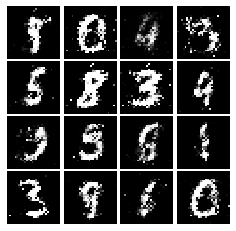

Epoch: 7, Iter: 3480, D: 0.2384, G:0.1756


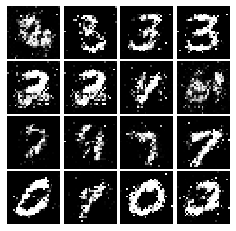

Epoch: 7, Iter: 3500, D: 0.2168, G:0.1556


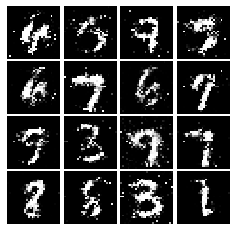

Epoch: 7, Iter: 3520, D: 0.2088, G:0.1784


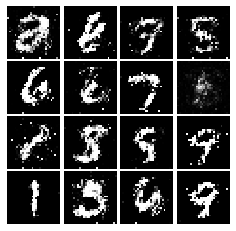

Epoch: 7, Iter: 3540, D: 0.2039, G:0.1972


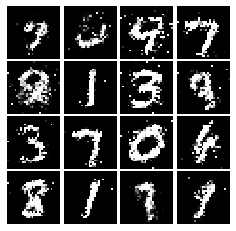

Epoch: 7, Iter: 3560, D: 0.2109, G:0.17


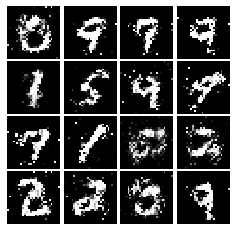

Epoch: 7, Iter: 3580, D: 0.2215, G:0.1592


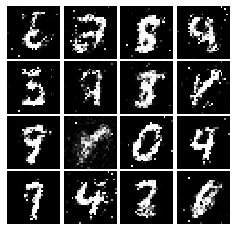

Epoch: 7, Iter: 3600, D: 0.211, G:0.1903


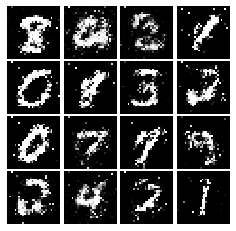

Epoch: 7, Iter: 3620, D: 0.223, G:0.2212


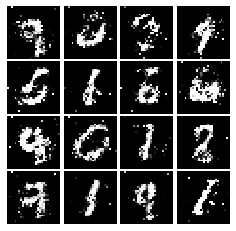

Epoch: 7, Iter: 3640, D: 0.227, G:0.2006


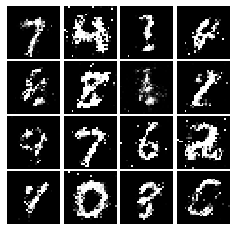

Epoch: 7, Iter: 3660, D: 0.2138, G:0.1578


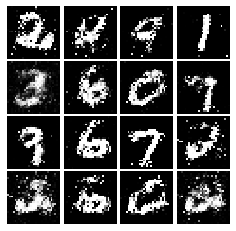

Epoch: 7, Iter: 3680, D: 0.2085, G:0.2105


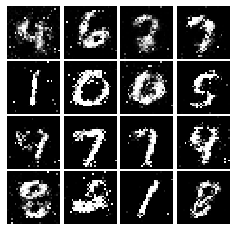

Epoch: 7, Iter: 3700, D: 0.2093, G:0.1691


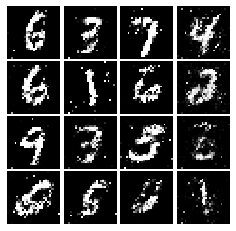

Epoch: 7, Iter: 3720, D: 0.2029, G:0.1873


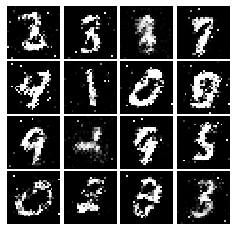

Epoch: 7, Iter: 3740, D: 0.2228, G:0.1498


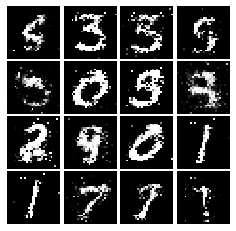

Epoch: 8, Iter: 3760, D: 0.2186, G:0.1704


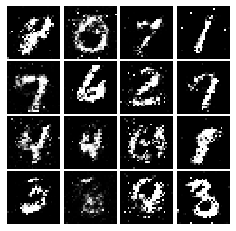

Epoch: 8, Iter: 3780, D: 0.2276, G:0.1788


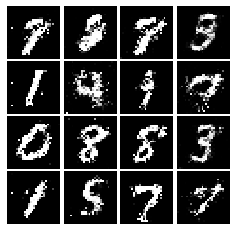

Epoch: 8, Iter: 3800, D: 0.2334, G:0.1739


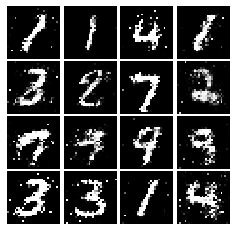

Epoch: 8, Iter: 3820, D: 0.2392, G:0.212


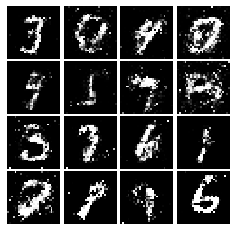

Epoch: 8, Iter: 3840, D: 0.2197, G:0.1403


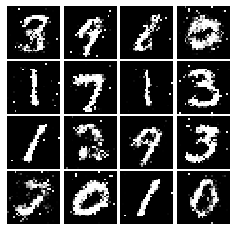

Epoch: 8, Iter: 3860, D: 0.216, G:0.1729


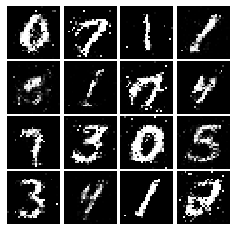

Epoch: 8, Iter: 3880, D: 0.2263, G:0.1781


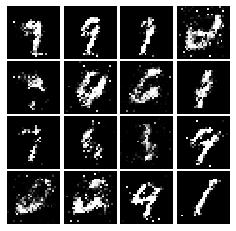

Epoch: 8, Iter: 3900, D: 0.2356, G:0.1801


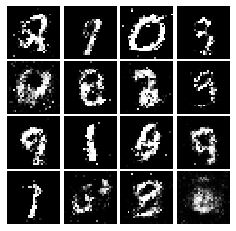

Epoch: 8, Iter: 3920, D: 0.2194, G:0.2006


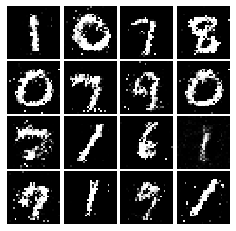

Epoch: 8, Iter: 3940, D: 0.2284, G:0.1846


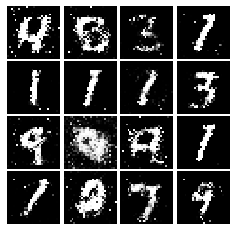

Epoch: 8, Iter: 3960, D: 0.2413, G:0.1724


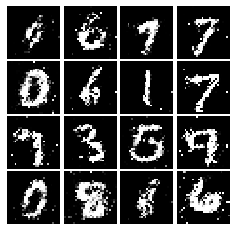

Epoch: 8, Iter: 3980, D: 0.2186, G:0.1771


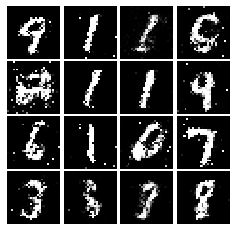

Epoch: 8, Iter: 4000, D: 0.2117, G:0.1647


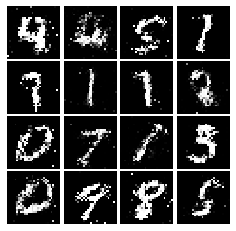

Epoch: 8, Iter: 4020, D: 0.2326, G:0.1738


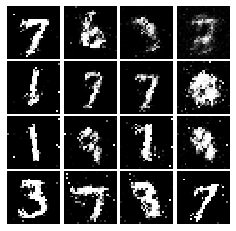

Epoch: 8, Iter: 4040, D: 0.2153, G:0.183


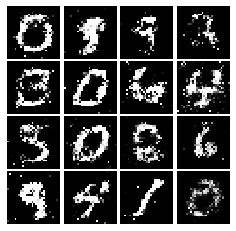

Epoch: 8, Iter: 4060, D: 0.2454, G:0.2046


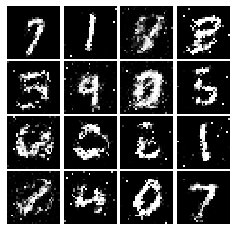

Epoch: 8, Iter: 4080, D: 0.2368, G:0.1635


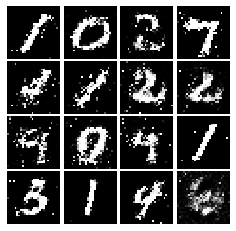

Epoch: 8, Iter: 4100, D: 0.2212, G:0.1769


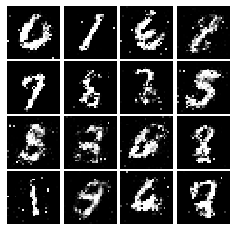

Epoch: 8, Iter: 4120, D: 0.2189, G:0.1813


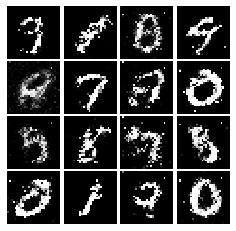

Epoch: 8, Iter: 4140, D: 0.2152, G:0.1707


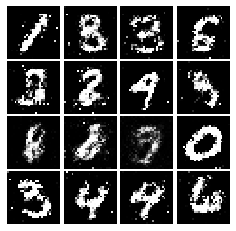

Epoch: 8, Iter: 4160, D: 0.243, G:0.1596


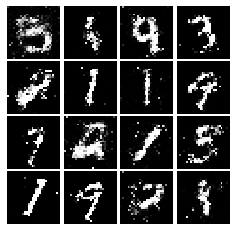

Epoch: 8, Iter: 4180, D: 0.2443, G:0.1633


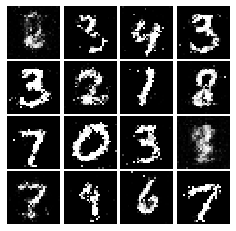

Epoch: 8, Iter: 4200, D: 0.2269, G:0.1928


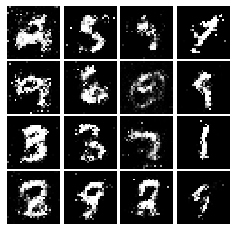

Epoch: 8, Iter: 4220, D: 0.2007, G:0.2346


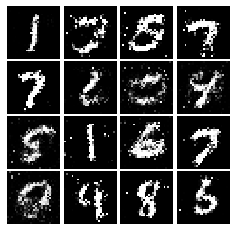

Epoch: 9, Iter: 4240, D: 0.2429, G:0.1908


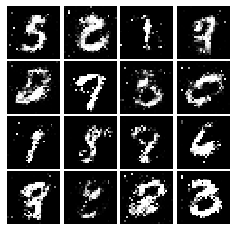

Epoch: 9, Iter: 4260, D: 0.2419, G:0.178


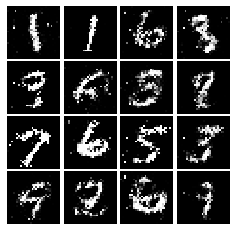

Epoch: 9, Iter: 4280, D: 0.2424, G:0.1822


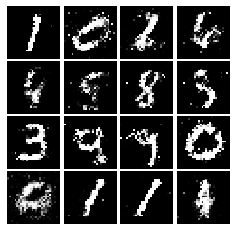

Epoch: 9, Iter: 4300, D: 0.2478, G:0.1567


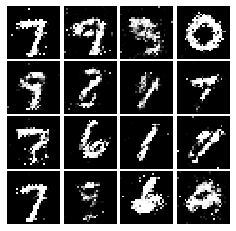

Epoch: 9, Iter: 4320, D: 0.2407, G:0.1768


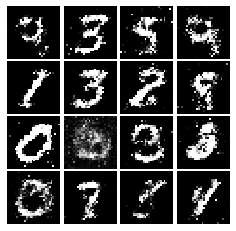

Epoch: 9, Iter: 4340, D: 0.2274, G:0.1559


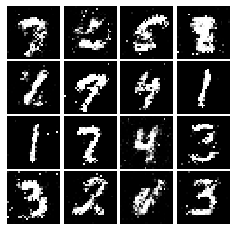

Epoch: 9, Iter: 4360, D: 0.2355, G:0.18


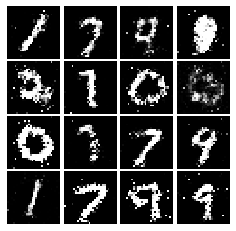

Epoch: 9, Iter: 4380, D: 0.2538, G:0.1431


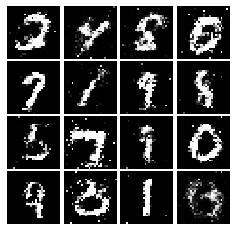

Epoch: 9, Iter: 4400, D: 0.2007, G:0.193


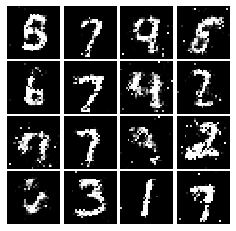

Epoch: 9, Iter: 4420, D: 0.2186, G:0.1536


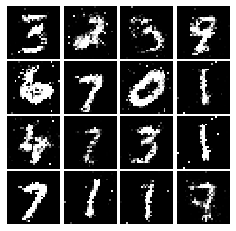

Epoch: 9, Iter: 4440, D: 0.2268, G:0.1825


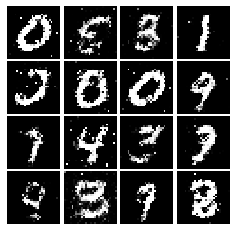

Epoch: 9, Iter: 4460, D: 0.2314, G:0.1559


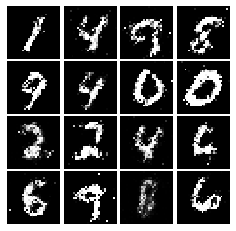

Epoch: 9, Iter: 4480, D: 0.2248, G:0.1719


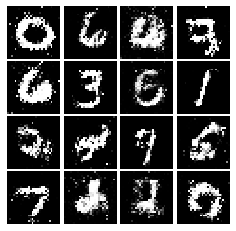

Epoch: 9, Iter: 4500, D: 0.2406, G:0.1338


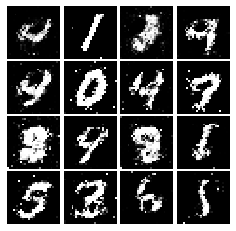

Epoch: 9, Iter: 4520, D: 0.2264, G:0.1585


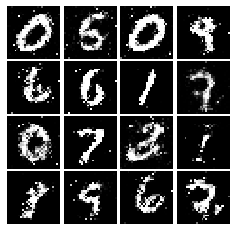

Epoch: 9, Iter: 4540, D: 0.2454, G:0.1645


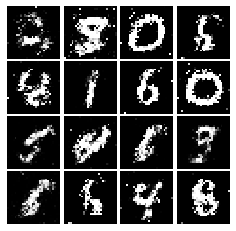

Epoch: 9, Iter: 4560, D: 0.2155, G:0.1714


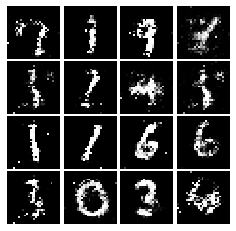

Epoch: 9, Iter: 4580, D: 0.2206, G:0.1832


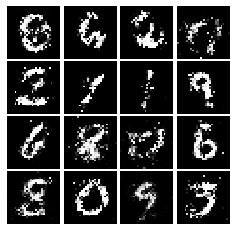

Epoch: 9, Iter: 4600, D: 0.2243, G:0.1759


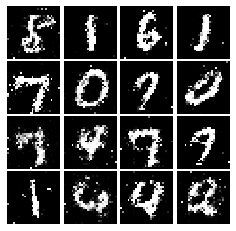

Epoch: 9, Iter: 4620, D: 0.2071, G:0.1721


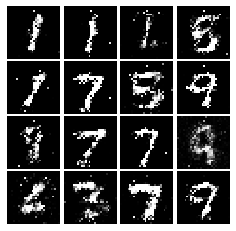

Epoch: 9, Iter: 4640, D: 0.2379, G:0.1805


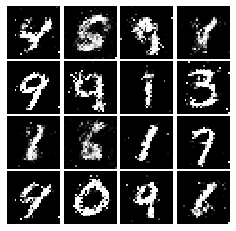

Epoch: 9, Iter: 4660, D: 0.2379, G:0.1711


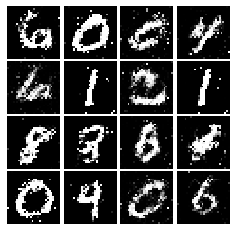

Epoch: 9, Iter: 4680, D: 0.2344, G:0.1848


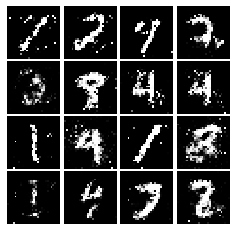

Final images


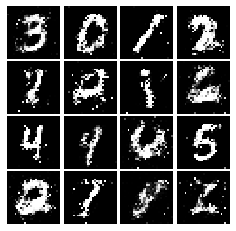

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [21]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Reshape((28, 28, 1), input_shape=(784,)),
        tf.keras.layers.Conv2D(filters=32, kernel_size=5, strides=1, input_shape=(28, 28, 1), activation=leaky_relu),
        tf.keras.layers.MaxPool2D(pool_size=2, strides=2),
        tf.keras.layers.Conv2D(filters=64, kernel_size=5, strides=1, activation=leaky_relu),
        tf.keras.layers.MaxPool2D(pool_size=2, strides=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(units=4*4*64, activation=leaky_relu),
        tf.keras.layers.Dense(units=1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [36]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    model.add(tf.keras.layers.Dense(units=1024, input_shape=(noise_dim,), activation=tf.nn.relu))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(units=7*7*128, activation=tf.nn.relu))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Reshape((7, 7, 128)))
    model.add(tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=4, strides=2, padding='same', input_shape=(7, 7, 128), activation=tf.nn.relu))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Conv2DTranspose(filters=1, kernel_size=4, strides=2, padding='same', activation=tf.nn.tanh))
    model.add(tf.keras.layers.Reshape((784,)))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.388, G:0.6573


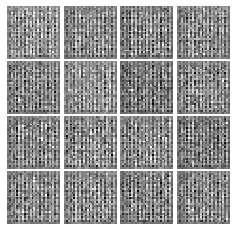

Epoch: 0, Iter: 20, D: 0.3756, G:1.472


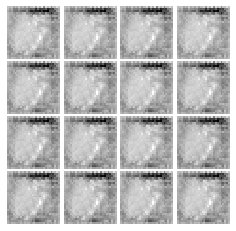

Epoch: 0, Iter: 40, D: 0.04315, G:4.962


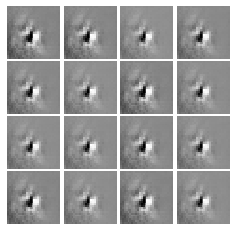

Epoch: 0, Iter: 60, D: 2.282, G:1.98


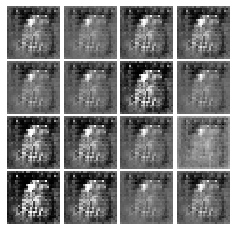

Epoch: 0, Iter: 80, D: 0.3812, G:2.952


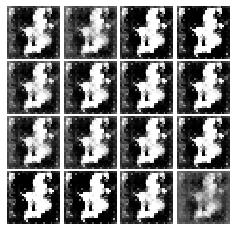

Epoch: 0, Iter: 100, D: 0.04822, G:4.229


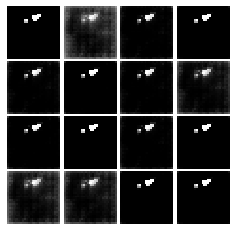

Epoch: 0, Iter: 120, D: 0.4862, G:2.787


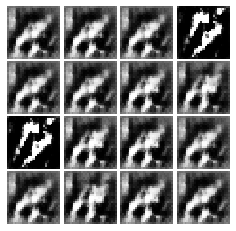

Epoch: 0, Iter: 140, D: 0.3904, G:2.834


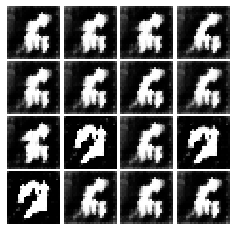

Epoch: 0, Iter: 160, D: 0.6512, G:2.477


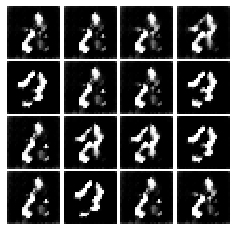

Epoch: 0, Iter: 180, D: 0.4359, G:2.253


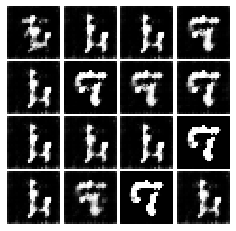

Epoch: 0, Iter: 200, D: 1.973, G:1.951


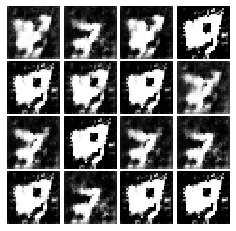

Epoch: 0, Iter: 220, D: 0.2745, G:3.339


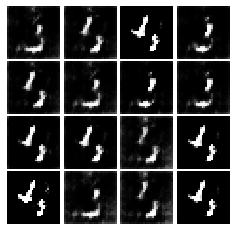

Epoch: 0, Iter: 240, D: 0.4344, G:1.925


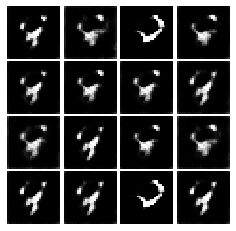

Epoch: 0, Iter: 260, D: 1.212, G:4.667


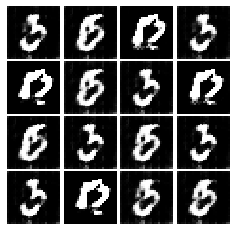

Epoch: 0, Iter: 280, D: 0.1622, G:3.232


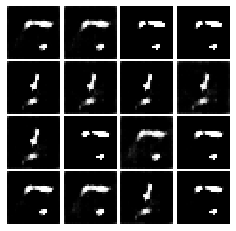

Epoch: 0, Iter: 300, D: 0.5245, G:2.138


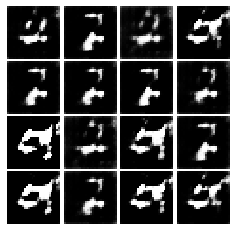

Epoch: 0, Iter: 320, D: 0.4664, G:3.283


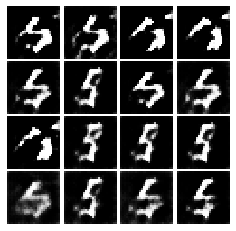

Epoch: 0, Iter: 340, D: 0.4511, G:2.329


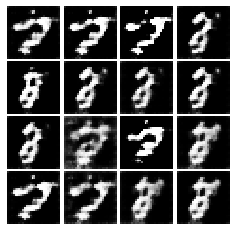

Epoch: 0, Iter: 360, D: 0.7509, G:2.97


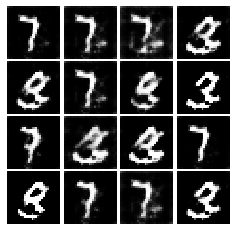

Epoch: 0, Iter: 380, D: 0.5737, G:2.431


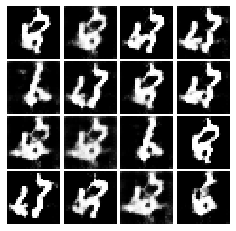

Epoch: 0, Iter: 400, D: 1.644, G:0.8668


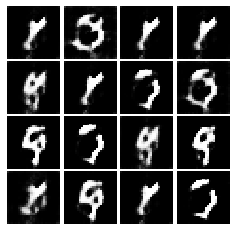

Epoch: 0, Iter: 420, D: 0.6995, G:2.857


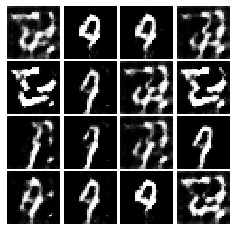

Epoch: 0, Iter: 440, D: 1.145, G:4.296


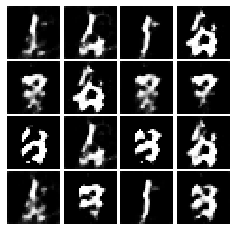

Epoch: 0, Iter: 460, D: 0.2946, G:5.032


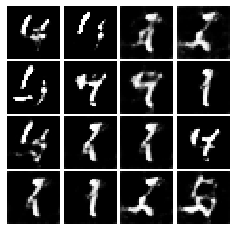

Epoch: 1, Iter: 480, D: 0.4084, G:3.095


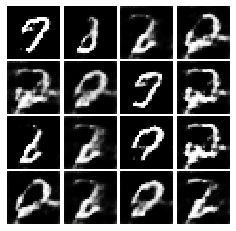

Epoch: 1, Iter: 500, D: 0.5003, G:2.1


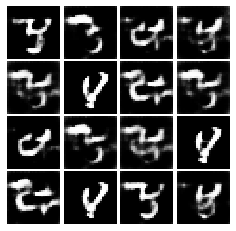

Epoch: 1, Iter: 520, D: 0.5825, G:2.106


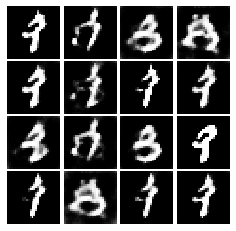

Epoch: 1, Iter: 540, D: 0.7502, G:2.002


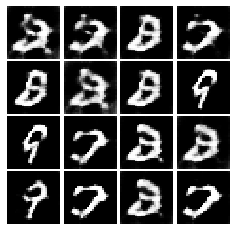

Epoch: 1, Iter: 560, D: 0.6946, G:2.793


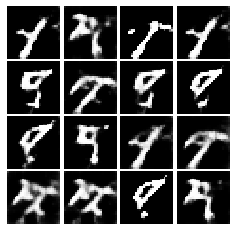

Epoch: 1, Iter: 580, D: 0.6641, G:2.16


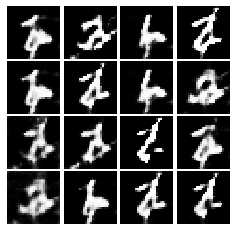

Epoch: 1, Iter: 600, D: 0.4107, G:2.842


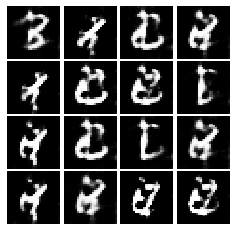

Epoch: 1, Iter: 620, D: 0.3936, G:3.979


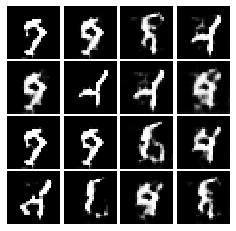

Epoch: 1, Iter: 640, D: 0.9428, G:3.305


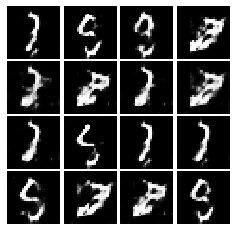

Epoch: 1, Iter: 660, D: 0.859, G:0.9964


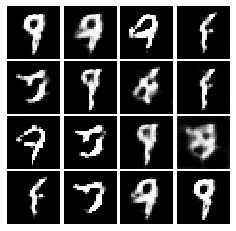

Epoch: 1, Iter: 680, D: 0.445, G:2.682


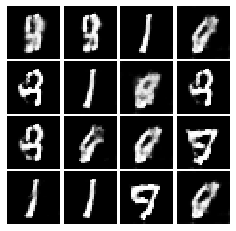

Epoch: 1, Iter: 700, D: 0.365, G:3.991


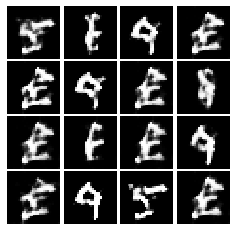

Epoch: 1, Iter: 720, D: 0.6583, G:6.536


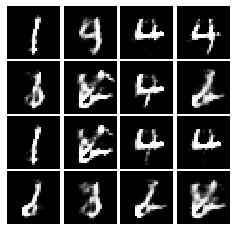

Epoch: 1, Iter: 740, D: 0.6299, G:1.907


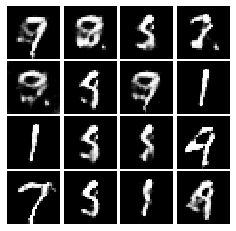

Epoch: 1, Iter: 760, D: 0.748, G:2.057


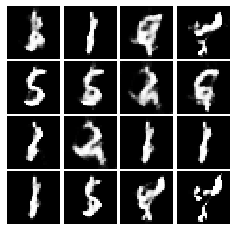

Epoch: 1, Iter: 780, D: 0.3105, G:2.846


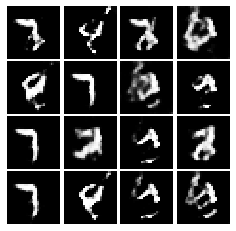

Epoch: 1, Iter: 800, D: 0.4284, G:2.38


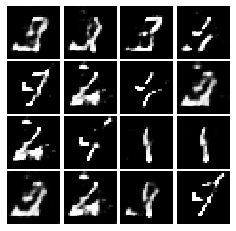

Epoch: 1, Iter: 820, D: 0.4424, G:2.41


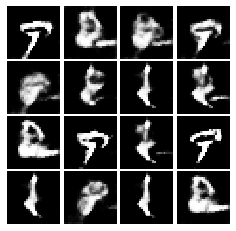

Epoch: 1, Iter: 840, D: 0.7092, G:1.998


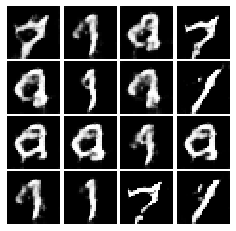

Epoch: 1, Iter: 860, D: 0.4168, G:3.246


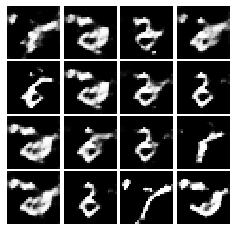

Epoch: 1, Iter: 880, D: 0.5321, G:3.824


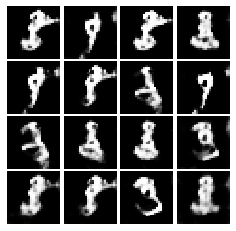

Epoch: 1, Iter: 900, D: 0.5481, G:4.554


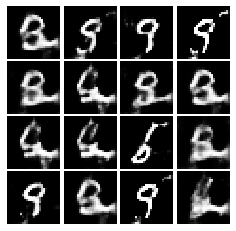

Epoch: 1, Iter: 920, D: 0.6695, G:3.838


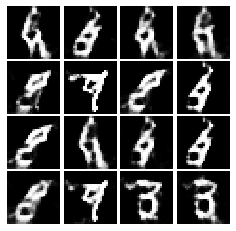

Epoch: 2, Iter: 940, D: 0.2626, G:3.044


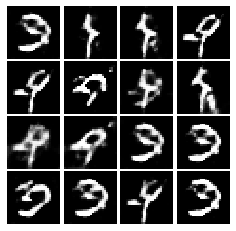

Epoch: 2, Iter: 960, D: 0.5284, G:3.114


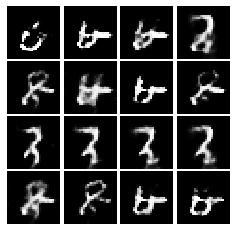

Epoch: 2, Iter: 980, D: 0.4842, G:2.211


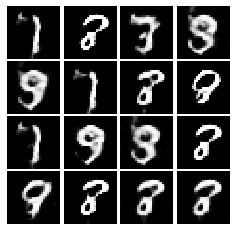

Epoch: 2, Iter: 1000, D: 0.5934, G:2.45


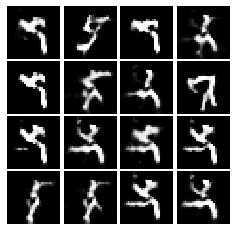

Epoch: 2, Iter: 1020, D: 0.3581, G:2.98


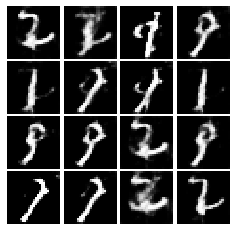

Epoch: 2, Iter: 1040, D: 1.13, G:4.949


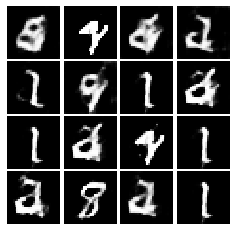

Epoch: 2, Iter: 1060, D: 0.6208, G:2.382


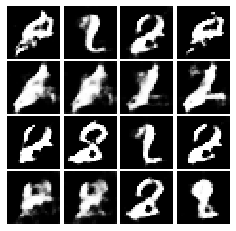

Epoch: 2, Iter: 1080, D: 0.7578, G:3.382


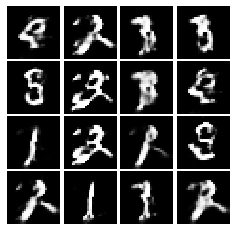

Epoch: 2, Iter: 1100, D: 0.6488, G:1.965


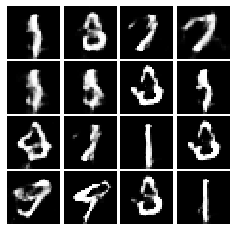

Epoch: 2, Iter: 1120, D: 0.6249, G:1.649


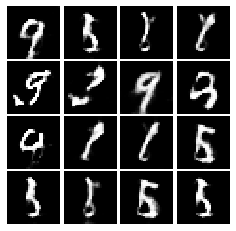

Epoch: 2, Iter: 1140, D: 0.6762, G:2.738


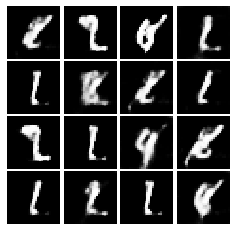

Epoch: 2, Iter: 1160, D: 0.4194, G:2.391


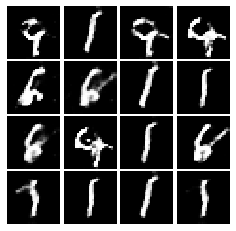

Epoch: 2, Iter: 1180, D: 0.5102, G:2.165


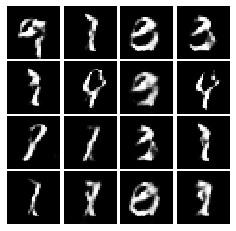

Epoch: 2, Iter: 1200, D: 0.5122, G:1.937


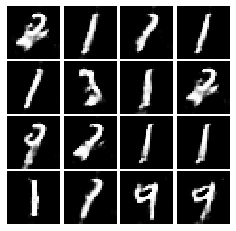

Epoch: 2, Iter: 1220, D: 0.4126, G:2.316


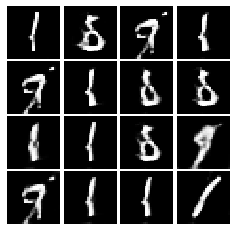

Epoch: 2, Iter: 1240, D: 0.4493, G:2.425


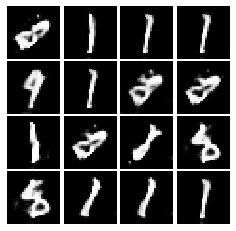

Epoch: 2, Iter: 1260, D: 0.4478, G:1.894


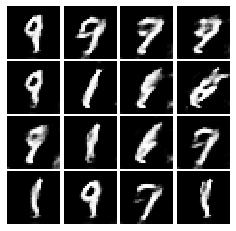

Epoch: 2, Iter: 1280, D: 0.5196, G:2.145


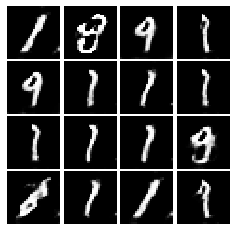

Epoch: 2, Iter: 1300, D: 0.3246, G:3.071


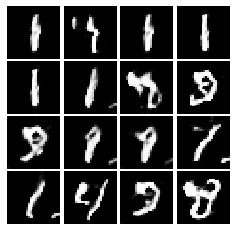

Epoch: 2, Iter: 1320, D: 0.738, G:2.124


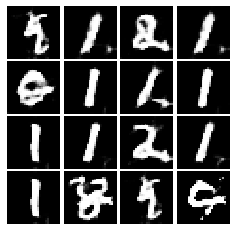

Epoch: 2, Iter: 1340, D: 0.4529, G:2.55


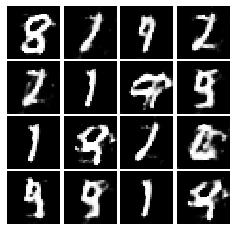

Epoch: 2, Iter: 1360, D: 0.515, G:1.937


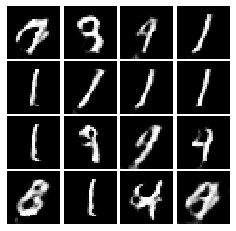

Epoch: 2, Iter: 1380, D: 0.425, G:2.268


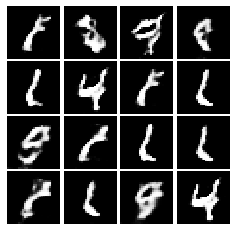

Epoch: 2, Iter: 1400, D: 0.3916, G:2.285


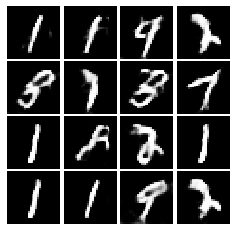

Epoch: 3, Iter: 1420, D: 0.5597, G:2.361


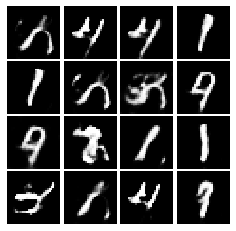

Epoch: 3, Iter: 1440, D: 0.5078, G:2.666


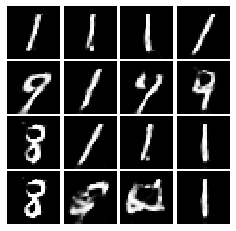

Epoch: 3, Iter: 1460, D: 0.7426, G:1.774


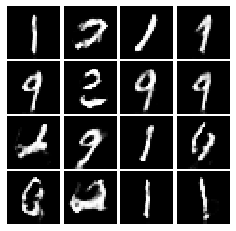

Epoch: 3, Iter: 1480, D: 0.43, G:2.844


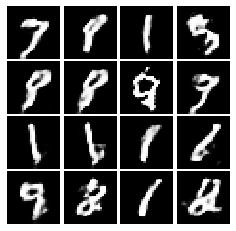

Epoch: 3, Iter: 1500, D: 0.585, G:2.098


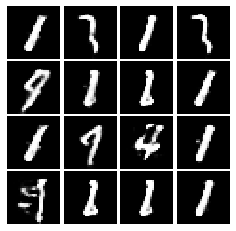

Epoch: 3, Iter: 1520, D: 0.5627, G:2.302


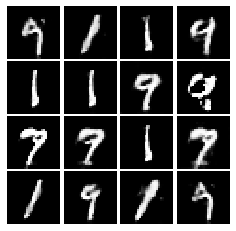

Epoch: 3, Iter: 1540, D: 0.5097, G:2.682


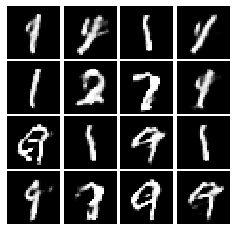

Epoch: 3, Iter: 1560, D: 0.6085, G:3.08


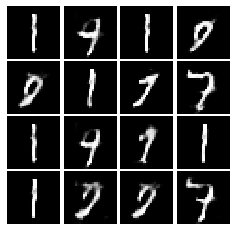

Epoch: 3, Iter: 1580, D: 0.5098, G:2.487


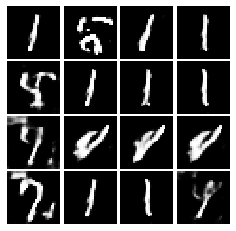

Epoch: 3, Iter: 1600, D: 0.5786, G:1.803


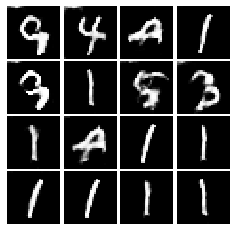

Epoch: 3, Iter: 1620, D: 0.4935, G:2.403


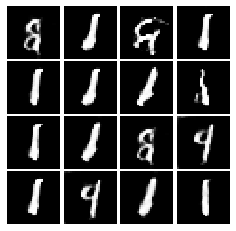

Epoch: 3, Iter: 1640, D: 0.5437, G:2.358


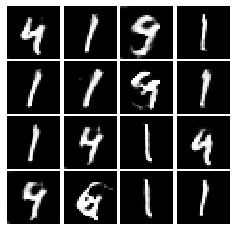

Epoch: 3, Iter: 1660, D: 0.5983, G:3.054


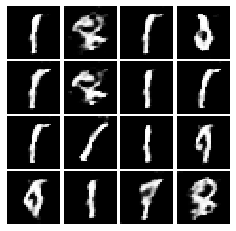

Epoch: 3, Iter: 1680, D: 0.4564, G:2.207


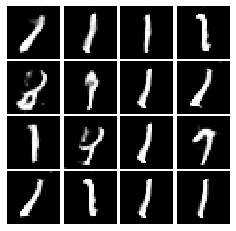

Epoch: 3, Iter: 1700, D: 0.4904, G:1.526


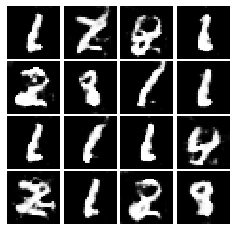

Epoch: 3, Iter: 1720, D: 0.567, G:2.581


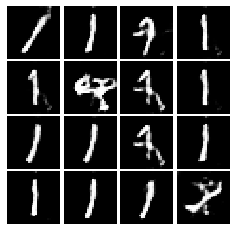

Epoch: 3, Iter: 1740, D: 0.5541, G:2.292


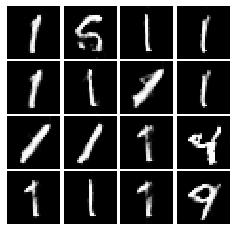

Epoch: 3, Iter: 1760, D: 0.4346, G:2.303


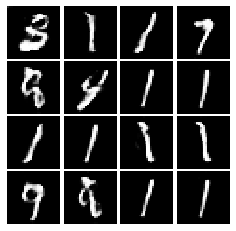

Epoch: 3, Iter: 1780, D: 0.5291, G:2.613


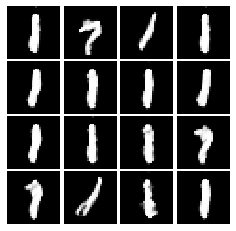

Epoch: 3, Iter: 1800, D: 0.4734, G:2.1


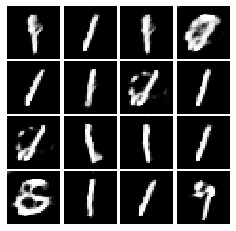

Epoch: 3, Iter: 1820, D: 0.6019, G:3.072


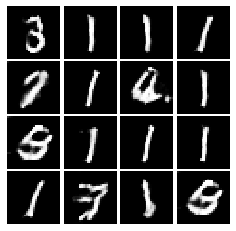

Epoch: 3, Iter: 1840, D: 0.5218, G:2.18


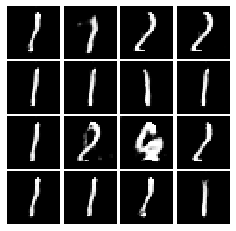

Epoch: 3, Iter: 1860, D: 0.5292, G:2.364


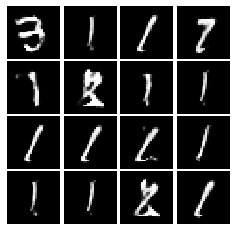

Epoch: 4, Iter: 1880, D: 0.4212, G:2.444


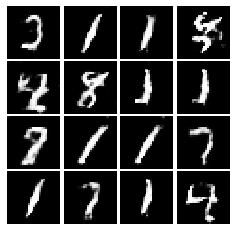

Epoch: 4, Iter: 1900, D: 0.484, G:2.633


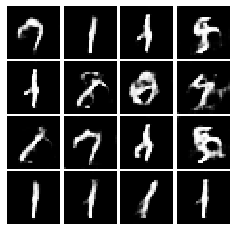

Epoch: 4, Iter: 1920, D: 0.5716, G:2.237


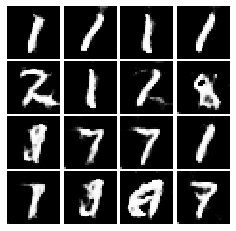

Epoch: 4, Iter: 1940, D: 0.4474, G:2.49


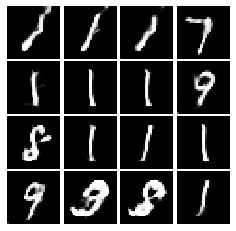

Epoch: 4, Iter: 1960, D: 0.5214, G:1.852


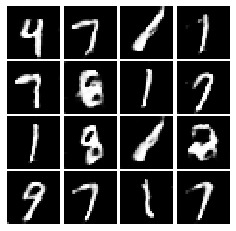

Epoch: 4, Iter: 1980, D: 0.4362, G:2.562


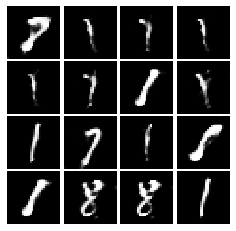

Epoch: 4, Iter: 2000, D: 0.8891, G:1.338


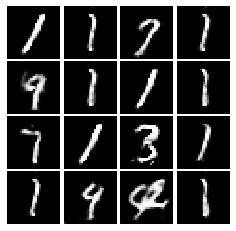

Epoch: 4, Iter: 2020, D: 0.501, G:2.467


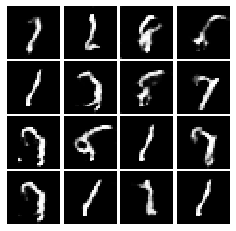

Epoch: 4, Iter: 2040, D: 0.5162, G:1.662


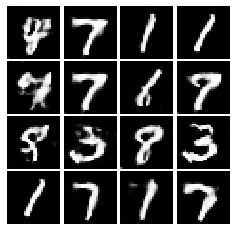

Epoch: 4, Iter: 2060, D: 0.5025, G:2.265


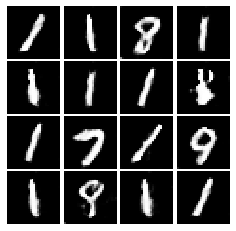

Epoch: 4, Iter: 2080, D: 0.628, G:2.214


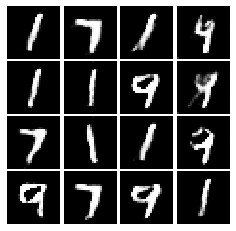

Epoch: 4, Iter: 2100, D: 0.5701, G:2.032


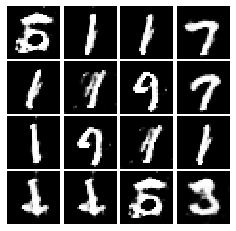

Epoch: 4, Iter: 2120, D: 0.4966, G:1.548


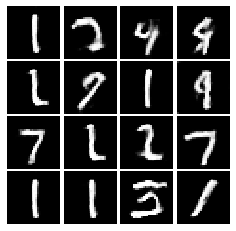

Epoch: 4, Iter: 2140, D: 0.9186, G:1.999


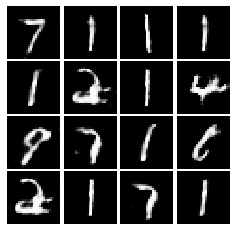

Epoch: 4, Iter: 2160, D: 0.6506, G:2.16


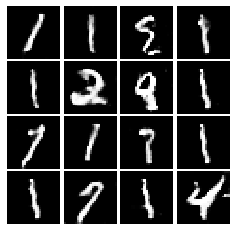

Epoch: 4, Iter: 2180, D: 0.5824, G:1.825


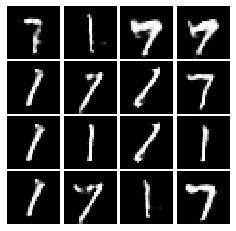

Epoch: 4, Iter: 2200, D: 0.5073, G:2.19


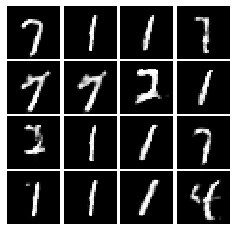

Epoch: 4, Iter: 2220, D: 0.3357, G:2.672


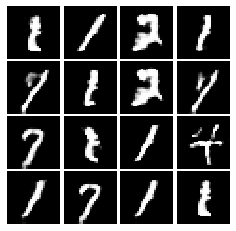

Epoch: 4, Iter: 2240, D: 0.5459, G:2.057


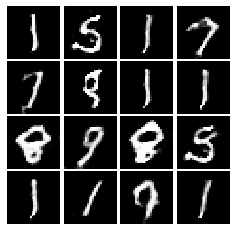

Epoch: 4, Iter: 2260, D: 0.4461, G:2.779


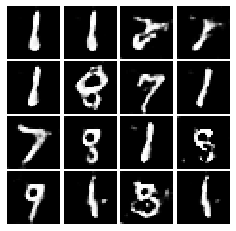

Epoch: 4, Iter: 2280, D: 0.5264, G:2.328


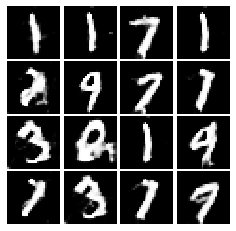

Epoch: 4, Iter: 2300, D: 0.5898, G:2.304


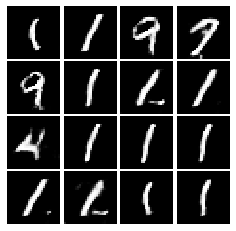

Epoch: 4, Iter: 2320, D: 0.7075, G:3.242


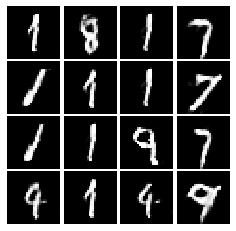

Epoch: 4, Iter: 2340, D: 0.7596, G:2.879


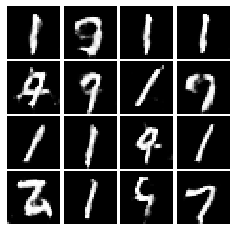

Final images


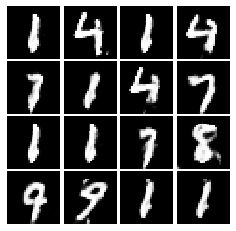

In [37]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2   |   1   |  -1   |  -2   |  -1   |   1      
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |  -1   |  -2   |  -1   |   1   |   2   |   1      
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 
Using the aforementioned method, we will not reach the optimal value because we get a cycle after a number of iterations.

## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
No, it is not a good sign because the discriminator is not learning to correctly classify real images (high loss). Thus, it can classify noisy images as real ones. Due to the generator starts with noisy images, these noisy images can be classified as real ones. Therefore, the generator loss decreases even if the generated images are noisy.